1. Import and Data Processing

1.1. Import Libraries and Load Data: 2 dòng cuối hiển thị đầy đủ tất cả các cột và nội dung.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
from scipy.interpolate import make_interp_spline
from scipy import stats

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [ ]:
df_20_21 = pd.read_csv('diem_thi_2020_2021.csv',low_memory=False)
df_22 = pd.read_csv('diem_thi_thpt_2022.csv')
df_23 = pd.read_csv('diem_thi_thpt_2023.csv')
df_24 = pd.read_csv('diem_thi_thpt_2024.csv')

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1863944676.py:1: DtypeWarning: Columns (1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_20_21 = pd.read_csv('diem_thi_2020_2021.csv')


1.2. Data Cleaning and Preview (Xem thử vài dòng cuối của dữ liệu)

In [3]:
df_22.sort_values(by='sbd', ascending=True).tail(4)

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd
995437,64006585,5.6,6.50,2.8,NaN,NaN,NaN,6.25,6.75,8.50
995438,64006586,5.8,6.00,6.6,NaN,NaN,NaN,7.25,8.00,8.00
995439,64006587,7.6,6.75,7.0,NaN,NaN,NaN,8.75,7.25,9.75
995440,64006588,6.6,4.50,3.2,NaN,NaN,NaN,3.00,6.00,7.50


In [4]:
df_23.sort_values(by='sbd', ascending=True).tail(4)

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
1022056,64006934,7.4,7.5,6.0,6.0,5.75,6.25,NaN,NaN,NaN,N1
1022057,64006935,6.4,7.0,3.0,NaN,NaN,NaN,5.50,5.75,7.25,N1
1022058,64006936,6.6,7.0,5.8,NaN,NaN,NaN,6.50,6.50,9.25,N1
1022059,64006937,NaN,5.0,NaN,NaN,NaN,NaN,4.25,4.75,NaN,NaN


In [5]:
df_24.sort_values(by='sbd', ascending=True).tail(4)

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
1061601,64007283,5.2,6.00,3.6,NaN,NaN,NaN,6.25,5.75,7.75,N1
1061602,64007284,7.2,8.00,7.0,6.25,7.0,8.0,NaN,NaN,NaN,N1
1061603,64007285,5.2,5.25,4.4,NaN,NaN,NaN,4.75,6.50,8.75,N1
1061604,64007286,5.8,8.25,2.8,NaN,NaN,NaN,5.00,7.25,8.25,N1


Xem trước vài dòng đầu để kiểm tra SBD

In [6]:
df_20_21.sort_values(by='SBD', ascending=True).head(4)

,SBD,Tên,Ngày Sinh,Giới tính,Toán,Văn,Lý,Hoá,Sinh,Lịch Sử,Địa Lý,GDCD,Ngoại Ngữ,Year,code,province
870577,1000001,NaN,NaN,NaN,2.2,3.50,NaN,NaN,NaN,2.50,5.50,NaN,NaN,2021,1,Hà Nội
173247,1000001,NaN,NaN,NaN,7.0,6.00,NaN,NaN,NaN,8.00,NaN,NaN,NaN,2020,1,Hà Nội
173272,1000002,NaN,NaN,NaN,9.0,6.00,7.25,8.75,7.25,NaN,NaN,NaN,9.4,2020,1,Hà Nội
870670,1000002,NaN,NaN,NaN,9.2,8.25,NaN,NaN,NaN,5.75,9.75,9.25,10.0,2021,1,Hà Nội


1.3. Transform and Normalize Data

Dòng 1:thêm cột mới ma_ngoai_ngu vì file 2020-2021 không có sẵn cột này → thêm vào để thống nhất cấu trúc dữ liệu giữa các năm
Dòng 2:Chỉ giữ lại những cột quan trọng
Dòng 3:Đổi tên cột sang tên chuẩn bằng tiếng Việt không dấu, viết thường để dễ xử lý về sau

In [7]:
df_20_21['ma_ngoai_ngu'] = 'none'
df_20_21 = df_20_21[['SBD', 'Toán', 'Văn', 'Ngoại Ngữ', 'Lý', 'Hoá', 'Sinh', 'Lịch Sử', 'Địa Lý', 'GDCD', 'ma_ngoai_ngu', 'Year']]
df_20_21.columns = ['sbd', 'toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd', 'ma_ngoai_ngu', 'year']

In [8]:
df_20_21.sort_values(by='sbd', ascending=True).tail(5)

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year
1795579,64006834,8.6,8.25,6.2,8.25,7.00,6.5,NaN,NaN,NaN,none,2021
1795564,64006835,9.0,7.50,9.4,8.00,8.25,5.5,NaN,NaN,NaN,none,2021
1795575,64006836,4.8,7.00,4.6,NaN,NaN,NaN,3.75,7.00,9.00,none,2021
1795563,64006837,7.4,7.75,9.4,NaN,NaN,NaN,4.50,6.75,9.25,none,2021
1795577,64006838,8.0,7.75,8.2,NaN,NaN,NaN,4.25,6.50,7.50,none,2021


Gắn thêm năm và mã ngoại ngữ cho các bảng 2022–2024

In [9]:
df_22['ma_ngoai_ngu'] = 'none'
df_22['year'] = '2022'
df_23['year'] = '2023'
df_24['year'] = '2024'

In [10]:
df_22.head(4)

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year
0,1000001,3.6,5.00,4.0,NaN,NaN,NaN,2.75,6.0,8.75,none,2022
1,1000002,8.4,6.75,7.6,NaN,NaN,NaN,8.50,7.5,8.25,none,2022
2,1000003,5.8,7.50,5.0,NaN,NaN,NaN,7.25,5.5,8.75,none,2022
3,1000004,7.4,7.50,8.6,NaN,NaN,NaN,7.50,6.5,7.50,none,2022


1.4. Concatenate DataFrames và Kiểm tra dữ liệu sau khi gộp

In [11]:
df_data_all = pd.concat([df_24, df_23, df_22, df_20_21], ignore_index=True)

In [12]:
df_data_all.info()
df_data_all.tail(4)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4936983 entries, 0 to 4936982
Data columns (total 12 columns):
 #   Column        Dtype  
---  ------        -----  
 0   sbd           int64  
 1   toan          float64
 2   ngu_van       float64
 3   ngoai_ngu     float64
 4   vat_li        float64
 5   hoa_hoc       float64
 6   sinh_hoc      float64
 7   lich_su       float64
 8   dia_li        float64
 9   gdcd          float64
 10  ma_ngoai_ngu  object 
 11  year          object 
dtypes: float64(9), int64(1), object(2)
memory usage: 452.0+ MB


,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year
4936979,32008527,5.6,6.00,4.8,NaN,NaN,NaN,3.00,5.00,6.5,none,2021
4936980,32008528,6.6,8.00,4.0,NaN,NaN,NaN,4.75,6.50,8.0,none,2021
4936981,32008529,6.0,7.25,4.6,NaN,NaN,NaN,4.50,7.00,8.5,none,2021
4936982,32008530,3.8,5.75,2.8,NaN,NaN,NaN,2.25,5.25,6.5,none,2021


2. Add Province Code Information

2.1. Load Province Code Mapping

In [ ]:
df_ = pd.read_csv('diem_thi_2020_2021.csv', low_memory=False)

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\423306095.py:1: DtypeWarning: Columns (1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ = pd.read_csv('diem_thi_2020_2021.csv')


trích riêng ra bảng df_code_province chỉ gồm code và province vì File điểm thi có chứa mã tỉnh (code) và tên tỉnh (province), nhưng không phải tất cả các năm đều có.

In [14]:
df_code_province = df_[['code', 'province']].drop_duplicates()

Chuẩn hóa cột mã tỉnh: chuyển code thành số để sắp xếp or xử lý chính xác hơn -> chuyển ngược lại số (loại bỏ các giá trị lỗi nếu có)-> kiểm tra lại

In [15]:
df_code_province['code'] = df_code_province['code'].astype(str)

In [16]:
df_code_province['code'] = pd.to_numeric(df_code_province['code'], errors='coerce')
df_code_province.sort_values(by='code',ascending=True).tail(30)

,code,province
104340,35,Quảng Ngãi
292710,36,Kon Tum
328399,37,Bình Định
209181,38,Gia Lai
353158,39,Phú Yên
159847,40,Đăk Lăk
261659,41,Khánh Hòa
275862,42,Lâm Đồng
235688,43,Bình Phước
12344,44,Bình Dương


2.2. Extract Province Code from SBD: Tạo hàm tách mã tỉnh từ số báo danh(mã tỉnh nằm ở 1–2 chữ số đầu tiên) và dùng hàm get_code_from_sbd cho toàn bộ cột sbd → tạo ra cột code (mã tỉnh)

In [17]:
def get_code_from_sbd(sbd):
    sbd = str(sbd)
    if len(sbd) == 8:
        return sbd[:2]
    return sbd[:1]

df_data_all['code'] = df_data_all['sbd'].apply(get_code_from_sbd)

2.3. Merge with Province Data: gán tên tỉnh vào từng dòng dữ liệu thi

Dòng 1: chuyển code về dạng chuỗi ở cả 2 bảng để merge\
Dòng 2: hợp 2 bảng df_data_all và df_code_province theo cột code\
Dòng 3: giữ nguyên Dl gốc, chỉ thêm tên tỉnh nếu có

In [18]:
df_code_province['code'] = df_code_province['code'].astype(str)
df_data_all['code'] = df_data_all['code'].astype(str)
df_data_all = df_data_all.merge(df_code_province, on='code', how='left')

2.4. Inspect Final Data: ktra lại

In [19]:
df_data_all.info()
df_data_all.tail(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4936983 entries, 0 to 4936982
Data columns (total 14 columns):
 #   Column        Dtype  
---  ------        -----  
 0   sbd           int64  
 1   toan          float64
 2   ngu_van       float64
 3   ngoai_ngu     float64
 4   vat_li        float64
 5   hoa_hoc       float64
 6   sinh_hoc      float64
 7   lich_su       float64
 8   dia_li        float64
 9   gdcd          float64
 10  ma_ngoai_ngu  object 
 11  year          object 
 12  code          object 
 13  province      object 
dtypes: float64(9), int64(1), object(4)
memory usage: 527.3+ MB


,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,code,province
4936973,32008521,5.0,6.25,5.2,NaN,NaN,NaN,5.00,5.50,6.75,none,2021,32,Quảng Trị
4936974,32008522,5.0,5.75,4.2,NaN,NaN,NaN,3.25,6.00,6.00,none,2021,32,Quảng Trị
4936975,32008523,6.8,6.50,4.6,NaN,NaN,NaN,7.50,8.00,10.00,none,2021,32,Quảng Trị
4936976,32008524,6.0,6.75,4.8,NaN,NaN,NaN,5.25,6.25,8.50,none,2021,32,Quảng Trị
4936977,32008525,6.8,6.50,6.4,NaN,NaN,NaN,5.00,6.75,9.00,none,2021,32,Quảng Trị
4936978,32008526,5.8,6.00,3.2,NaN,NaN,NaN,3.75,5.50,7.50,none,2021,32,Quảng Trị
4936979,32008527,5.6,6.00,4.8,NaN,NaN,NaN,3.00,5.00,6.50,none,2021,32,Quảng Trị
4936980,32008528,6.6,8.00,4.0,NaN,NaN,NaN,4.75,6.50,8.00,none,2021,32,Quảng Trị
4936981,32008529,6.0,7.25,4.6,NaN,NaN,NaN,4.50,7.00,8.50,none,2021,32,Quảng Trị
4936982,32008530,3.8,5.75,2.8,NaN,NaN,NaN,2.25,5.25,6.50,none,2021,32,Quảng Trị


3. Analyze:

Dòng 1: Tạo một bản sao dữ liệu để phục vụ cho việc vẽ bản đồ\
Dòng 2: Đảm bảo cột year là kiểu chuỗi (để dễ xử lý khi vẽ nhiều năm)\
Dòng 3: kiểm tra các năm có trong dữ liệu là gì (2020–2024)

In [20]:
df_data_map = df_data_all.copy()
df_data_map['year'] = df_data_map['year'].astype(str)
df_data_map['year'].unique()

array(['2024', '2023', '2022', '2020', '2021'], dtype=object)

Phần 1: Tính toán DL
Biểu đồ cột kết hợp với phân tích tăng trưởng: Số lượng thí sinh theo từng năm và Tỷ lệ tăng trưởng thí sinh qua các năm (%)\
Dùng dữ liệu df_data_map (có thông tin năm, tỉnh...) làm nguồn\
Đếm số lượng thí sinh cho mỗi năm: value_counts(): đếm số dòng mỗi giá trị trong cột year, sort_index(): sắp xếp theo thứ tự năm (2020 → 2024)\
Tính tỷ lệ tăng trưởng: .pct_change(): tính phần trăm thay đổi so với năm trước * 100 => ra % tăng/giảm\
Tạo 1 bảng tổng hợp gồm 3 cột (year, Số lượng thí sinh, Tỷ lệ tăng trưởng), .reset_index() để cột year không còn là index, .rename() để đặt lại tên cột cho đẹp\
Phần 2: Định nghĩa hàm vẽ biểu đồ cột có nhãn (từ def )
Hàm để vẽ biểu đồ cột(ax: trục (vị trí) cần vẽ,x: dữ liệu trục X (năm), y: dữ liệu trục Y (giá trị), title, ylabel: tiêu đề và tên trục Y, color: màu cột, format_func: hàm định dạng số (ví dụ thêm dấu phẩy, làm tròn...)\
Dùng vòng lặp để thêm nhãn chữ lên từng cột: Lấy độ cao của cột bằng bar.get_height(), Ghi chữ giữa đỉnh cột bằng ax.text(...), Ghi theo format_func nếu có\
Cấu hình trục, tiêu đề, và định dạng số (từ ax.set) => Ghi nhãn trục, tiêu đề, và định dạng lại số ở trục Y cho dễ đọc
Phần 3: Gọi hàm vẽ biểu đồ(từ fig,ax)\
Tạo 1 figure gồm 2 trục (2 hàng, 1 cột) để vẽ 2 biểu đồ chồng nhau\
Vẽ biểu đồ số lượng thí sinh (có ax[0])\
Vẽ biểu đồ tỷ lệ tăng trưởng (có ax[1])\
Phần 4: hiển thị biểu đồ: tight_layout(): Căn lề tự động để không bị chồng chữ, show(): Hiển thị biểu đồ\

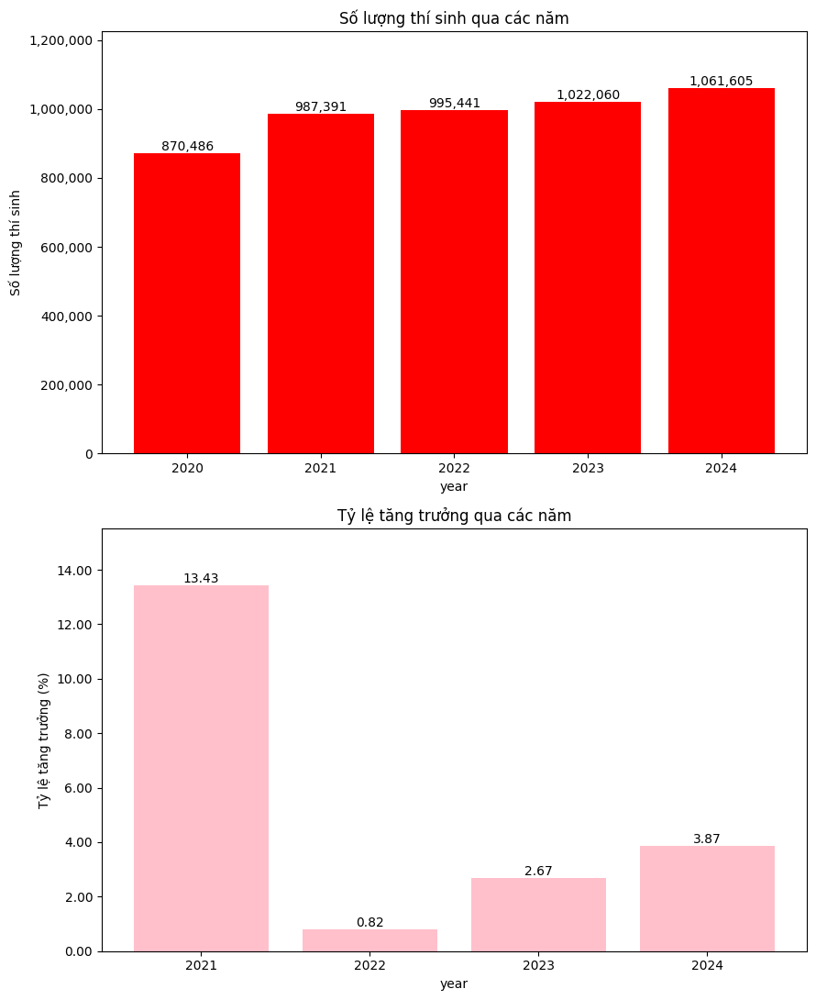

In [21]:
data = df_data_map

# Số lượng thí sinh mỗi năm
students_per_year = data['year'].value_counts().sort_index()

# Tỷ lệ tăng trưởng
growth_rate = students_per_year.pct_change() * 100

# Tạo DataFrame hiển thị kết quả
df_students_growth = pd.DataFrame({
    'Số lượng thí sinh': students_per_year,
    'Tỷ lệ tăng trưởng (%)': growth_rate
}).reset_index().rename(columns={'index': 'year'})

def plot_bar_chart(ax, x, y, title, ylabel, color, format_func=None):
    bars = ax.bar(x, y, color=color)

    # Thêm nhãn trên các cột
    for bar in bars:
        height = bar.get_height()
        if np.isfinite(height):  # Kiểm tra giá trị finite
            ax.text(
                bar.get_x() + bar.get_width() / 2,  # X vị trí của nhãn (giữa cột)
                height,  # Y vị trí của nhãn (trên đỉnh của cột)
                format_func(height) if format_func else f'{int(height)}',  # Nội dung nhãn
                ha='center',  # Canh giữa theo trục x
                va='bottom',  # Canh đáy theo trục y
                fontsize=10,  # Kích thước chữ của nhãn
                color='black'  # Màu chữ của nhãn
            )

    ax.set_xlabel('year')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(False)
    # Định dạng trục y
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: format_func(x) if format_func else f'{int(x)}'))
    # Tăng phạm vi trục y để đảm bảo các nhãn không bị cắt
    ax.set_ylim(0, ax.get_ylim()[1] * 1.1)

# Vẽ biểu đồ
fig, ax = plt.subplots(2, 1, figsize=(9, 11))

# Vẽ số lượng thí sinh
plot_bar_chart(
    ax[0], 
    df_students_growth['year'], 
    df_students_growth['Số lượng thí sinh'], 
    'Số lượng thí sinh qua các năm', 
    'Số lượng thí sinh', 
    'red',
    format_func=lambda x: f'{int(x):,}'  # Định dạng số với dấu phân cách hàng nghìn
)

# Vẽ tỷ lệ tăng trưởng
plot_bar_chart(
    ax[1], 
    df_students_growth['year'], 
    df_students_growth['Tỷ lệ tăng trưởng (%)'], 
    'Tỷ lệ tăng trưởng qua các năm', 
    'Tỷ lệ tăng trưởng (%)', 
    'pink',
    format_func=lambda x: f'{x:.2f}'  # Định dạng số với 2 chữ số thập phân
)

# Điều chỉnh layout để không bị chồng lấp
plt.tight_layout()
plt.show()

Score distribution over years: Điểm trung bình các môn qua các năm

Tạo danh sách tên cột dữ liệu (subjects) và tên hiển thị trên biểu đồ (titles)

In [22]:
def prepare_subject_title():
    subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']
    titles = ['Toán', 'Văn', 'Ngoại Ngữ', 'Lý', 'Hoá', 'Sinh', 'Lịch Sử', 'Địa Lý', 'GDCD']
    return subjects, titles

3 dòng đầu: Dùng df_data_map, chuyển year sang số để vẽ biểu đồ theo thời gian\
2 dòng sau: Tạo từ điển ánh xạ: 'toan' → 'Toán', 'ngu_van' → 'Văn'... để dùng làm nhãn khi vẽ\
1 dòng sau: Tính điểm trung bình mỗi môn theo từng năm\
TỪ plt.figure(figsize=(8, 4)): Vẽ biểu đồ đường mượt: Lặp qua từng môn học và Tính điểm trung bình từng năm, Dùng make_interp_spline() để vẽ đường cong mượt thay vì nối từng điểm góc cạnh,label=...: tên môn để đưa vào chú thích (legend), Thêm tiêu đề, nhãn trục, đặt các mốc năm cố định, và hiển thị biểu đồ\

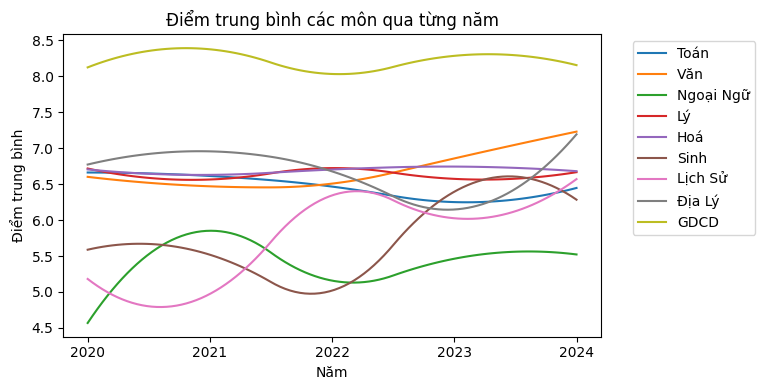

In [23]:
data = df_data_map

# Đổi định dạng year sang dạng số
data['year'] = pd.to_numeric(data['year'])
x_year = [2020, 2021, 2022, 2023, 2024]

# Định nghĩa các môn học và tiêu đề
subjects, titles = prepare_subject_title()

# Tạo từ điển ánh xạ các môn học sang tiêu đề
subject_to_title = dict(zip(subjects,titles))

# Tính toán điểm trung bình của các môn qua từng năm
mean_score_by_year = data.groupby('year')[subjects].mean().reset_index()

# Vẽ biểu đồ đường cho từng môn
plt.figure(figsize=(8, 4))

for subject in subjects:
    x = mean_score_by_year['year']
    y = mean_score_by_year[subject]

    # Tạo các điểm x mới để làm mịn đường
    x_new = np.linspace(x.min(), x.max(), 100)

    # Tạo spline để làm mịn đường
    spl = make_interp_spline(x, y, k=2)
    y_smooth = spl(x_new)

    plt.plot(x_new, y_smooth, label=subject_to_title[subject], linewidth=1.5, alpha=1)

plt.title('Điểm trung bình các môn qua từng năm')
plt.xlabel('Năm')
plt.ylabel('Điểm trung bình')
plt.xticks(x_year)
plt.legend(loc='upper right', bbox_to_anchor=(1.3,1))
plt.grid(False)
plt.tight_layout()
plt.show()

PHẦN 2: Biểu đồ phân phối (Histogram) từng môn qua từng năm

Tạo Hàm chọn ra 5 năm gần nhất trong dữ liệu => Trả về dữ liệu đó và danh sách năm đã sắp xếp

In [24]:
def prepare_recent_years_data(data):
    # Chuyển đổi cột 'year' sang dạng số
    data['year'] = pd.to_numeric(data['year'])
    # Lọc dữ liệu 5 năm gần đây
    recent_years = data[data['year'].isin(data['year'].unique()[-5:])]
    # Sắp xếp thứ tự các năm tăng dần
    recent_years_sorted = sorted(recent_years['year'].unique())
    return recent_years, recent_years_sorted


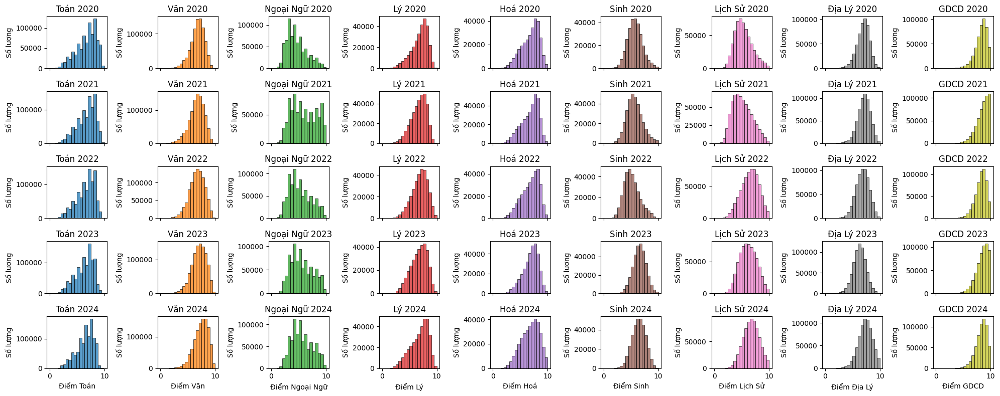

In [ ]:
data = df_data_map

# Chuẩn bị dữ liệu: Gọi hàm ở trên để lấy dữ liệu điểm 5 năm gần nhất
recent_years, recent_years_sorted = prepare_recent_years_data(data)

# Tạo histograms: Tạo lưới biểu đồ 5 hàng (5 năm) × 9 cột (9 môn học)
fig, axes = plt.subplots(5, 9, figsize=(20,8), sharex=True)

# Định nghĩa lại tên môn và bảng màu cho từng môn 
subjects, titles = prepare_subject_title()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']

# Lặp để vẽ từng biểu đồ nhỏ: Vẽ biểu đồ cho từng năm và từng môn
## Với mỗi năm (i) và môn học (j): Lọc dữ liệu điểm của môn đó trong năm đó -> Vẽ biểu đồ phân phối điểm số -> Thêm tiêu đề: "Toán 2021", "Lý 2022",..
for i, year in enumerate(recent_years_sorted):
    for j, (subject, color) in enumerate(zip(subjects, colors)):
        # Lọc dữ liệu cho môn học và năm cụ thể
        data_for_plot = recent_years[recent_years['year'] == year][subject]
        sns.histplot(data_for_plot, bins=20, kde=False, ax=axes[i,j], color=color, edgecolor='black')
        # Thiết lập tiêu đề và nhãn cho trục
        axes[i, j].set_title(f'{titles[j]} {year}')
        axes[i, j].set_xlabel(f'Điểm {titles[j]}')
        axes[i, j].set_ylabel('Số lượng')
# Căn lề đẹp và hiển thị toàn bộ lưới biểu đồ 5x9
plt.tight_layout()
plt.show()
        

Phân tích từng môn

Tạo hàm Thêm số lượng thí sinh lên đầu từng cột của biểu đồ histogram => dễ hình dung có bao nhiêu thí sinh đạt mỗi khoảng điểm

In [ ]:
def add_labels_to_histogram(hist, ax):
    # hist.patches: từng cột (thanh đứng) của biểu đồ
    for p in hist.patches:
        # get_height(): chiều cao của cột → chính là số thí sinh ở mức điểm đó
        height = p.get_height()
        if height > 0:  # Chỉ hiển thị nhãn cho các thanh có chiều cao lớn hơn 0
            # ax.text(...): thêm chữ vào giữa cột, cao hơn cột 0.5 đơn vị
            ax.text(p.get_x() + p.get_width() / 2, height + 0.5, 
                    f'{int(height)}', ha='center', va='bottom', 
                    fontsize=6, color='black')


Tạo hàm Tính các số liệu thống kê của dữ liệu year_data (tức điểm thi 1 môn trong 1 năm)

In [ ]:
def add_statistical_info(year_data):
    # Tính toán thông tin thống kê: điểm trung bình, điểm trung vị, độ lệch chuẩn (độ "rải" của điểm), độ lệch chuẩn (độ rải của điểm), phân vị P70, P80,... (ví dụ: P90 = điểm mà 90% thí sinh đạt thấp hơn)
    mean = year_data.mean()
    median = year_data.median()
    std_dev = year_data.std()
    percentiles = {p: year_data.quantile(p) for p in [0.70, 0.80, 0.90, 0.93, 0.95, 0.97, 0.99]}

    # Tạo nội dung dạng chuỗi để hiển thị các số liệu bên cạnh biểu đồ: Vẽ ô ghi chú nằm ngoài biểu đồ (tọa độ 1.05 là bên phải đồ thị)
    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nSTD: {std_dev:.2f}\n' +
                '\n'.join([f'P{int(p*100)}: {v:.2f}' for p, v in percentiles.items()]))
    # Nền màu vàng nhạt (wheat)
    # Hiển thị nội dung textstr
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.text(1.05, 0.5, textstr, transform=plt.gca().transAxes, 
                fontsize=7.5, verticalalignment='center', 
                horizontalalignment='left', bbox=props)

Vẽ biểu đồ cho từng môn học

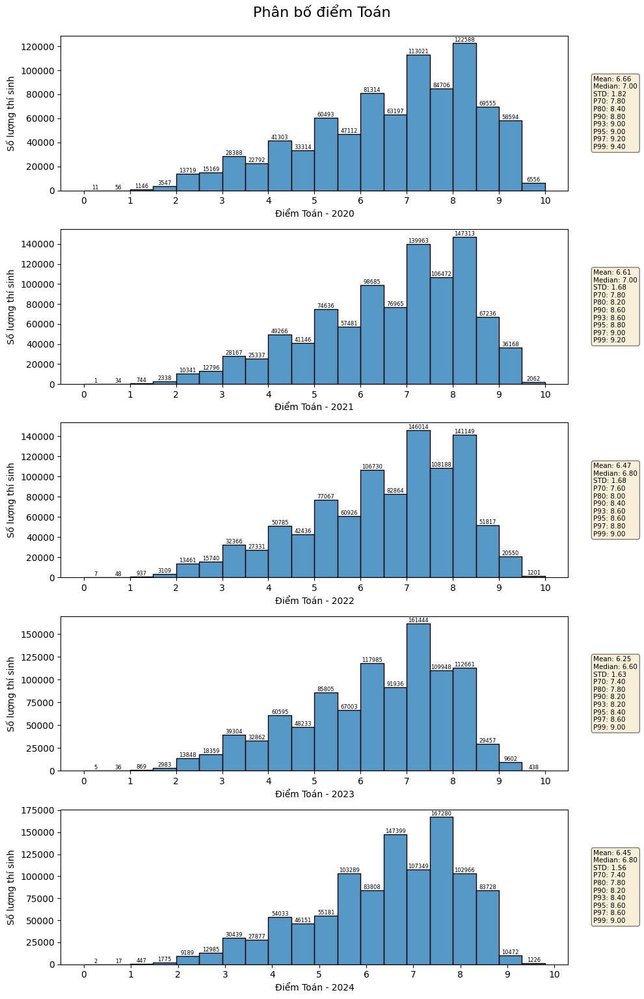

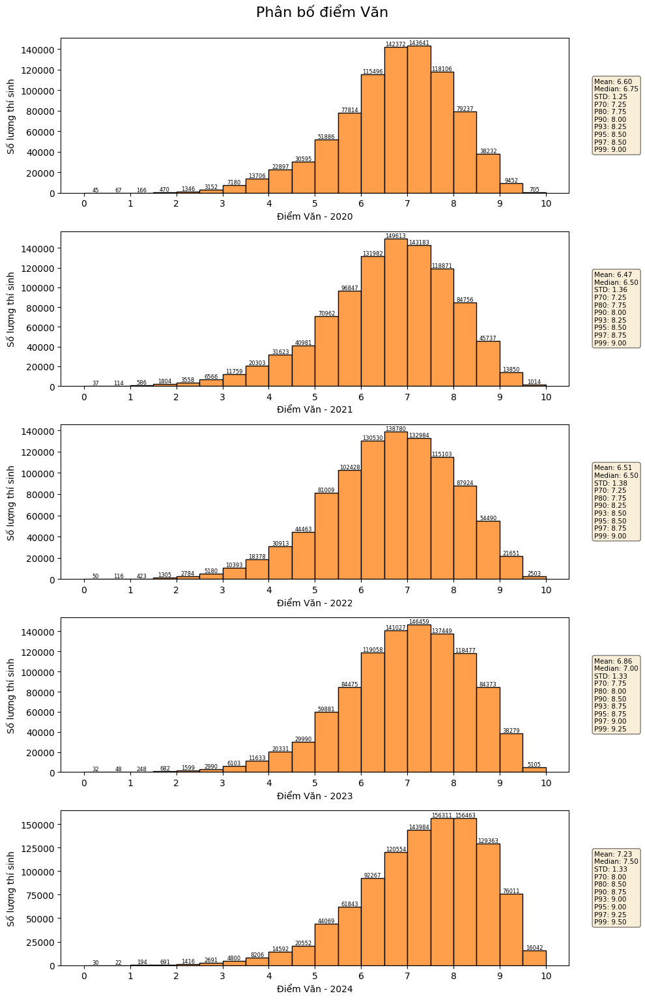

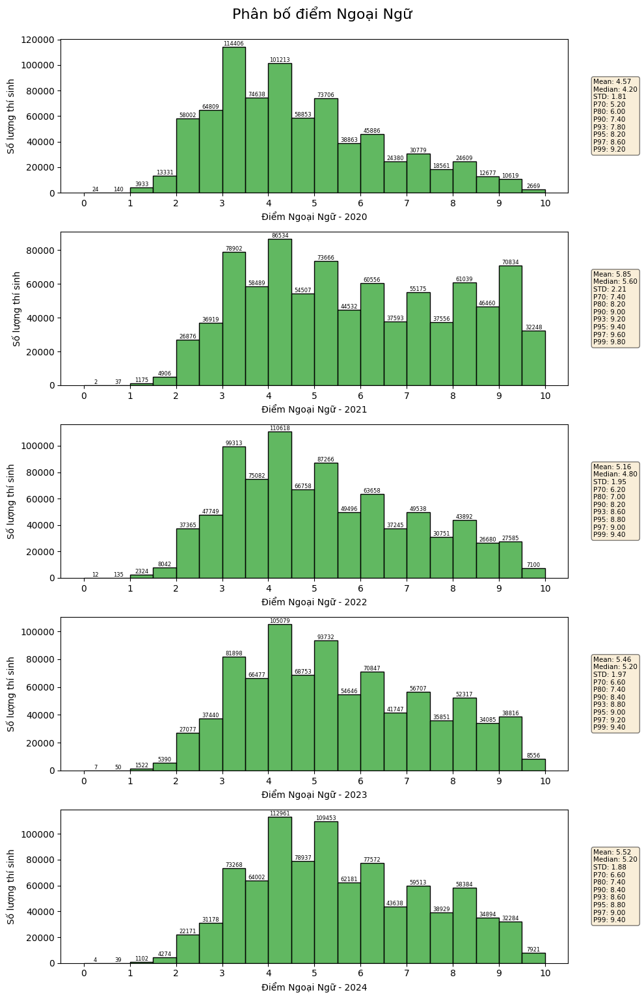

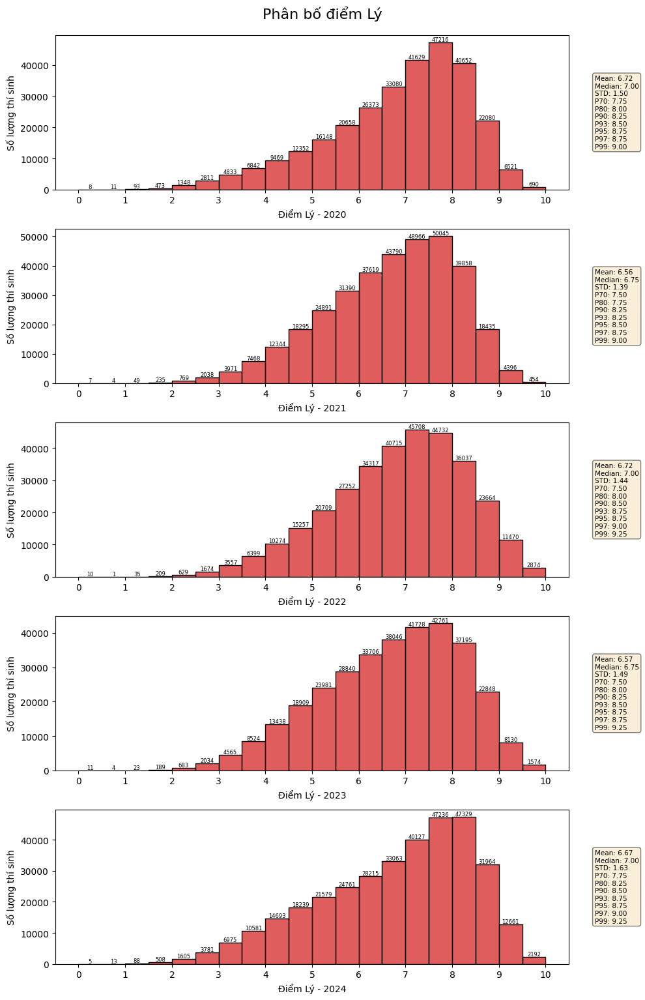

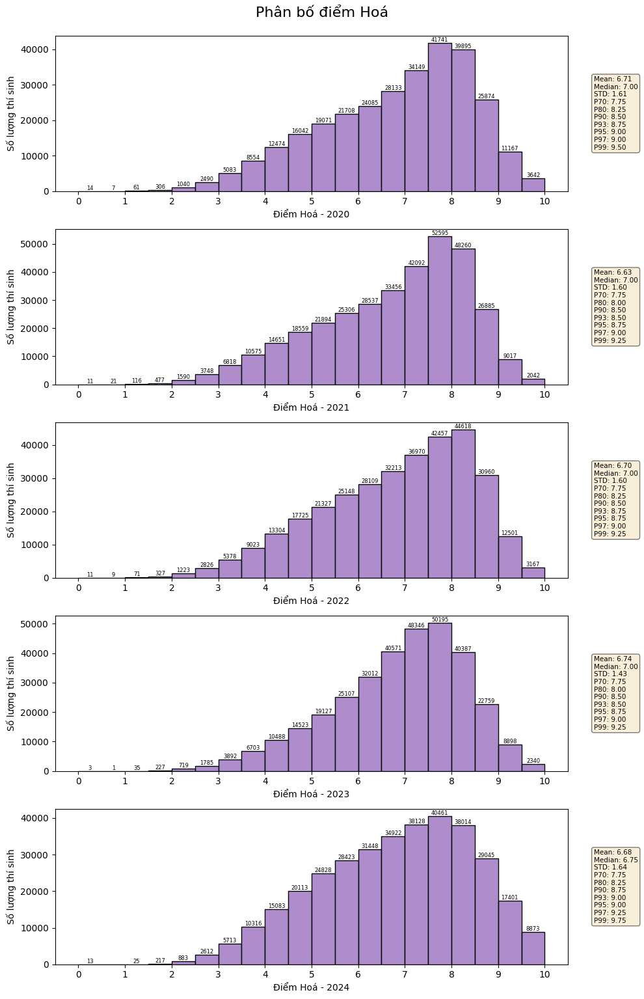

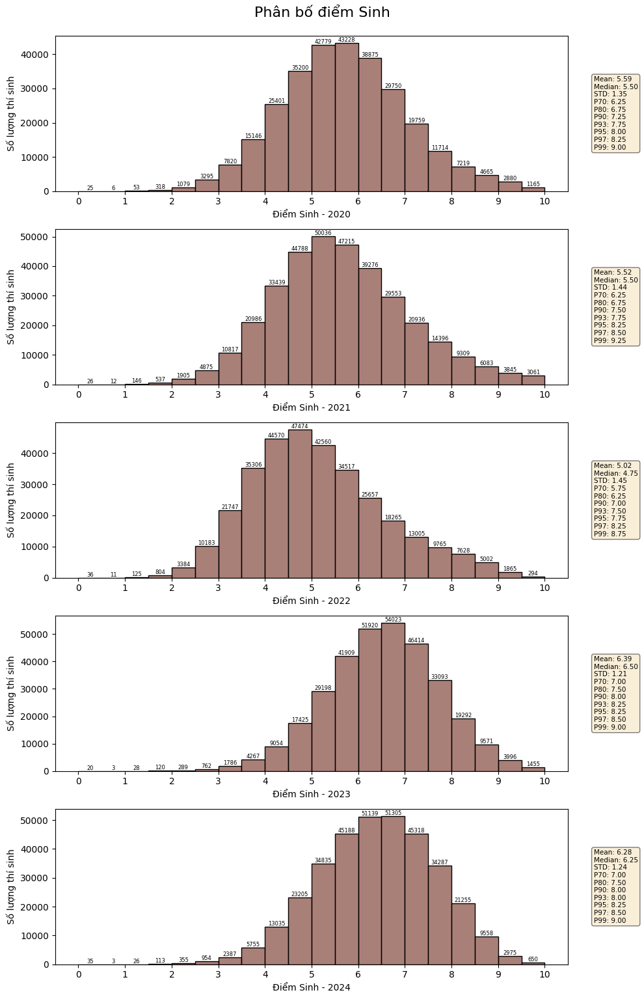

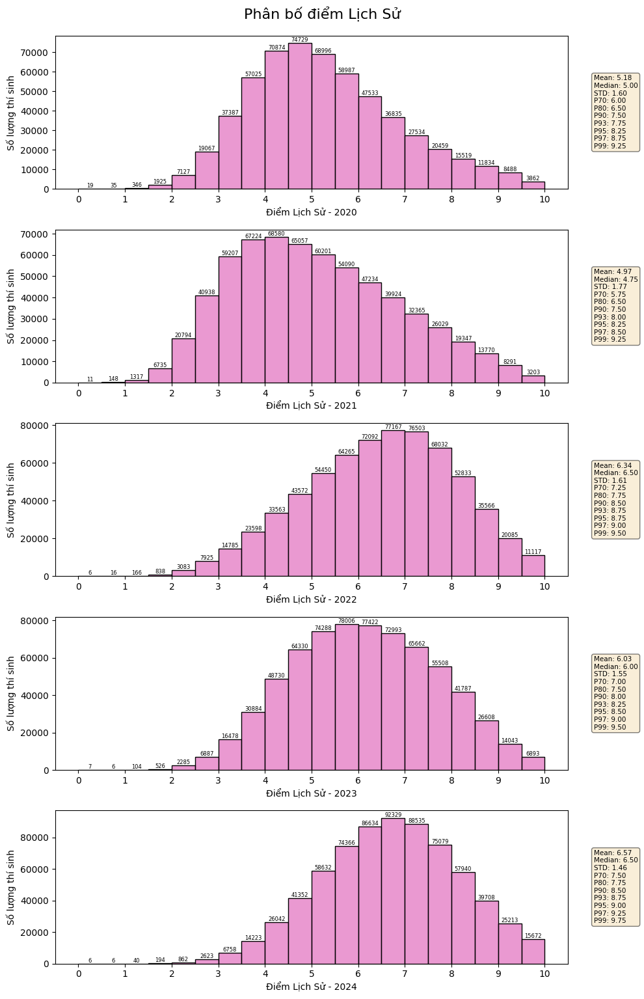

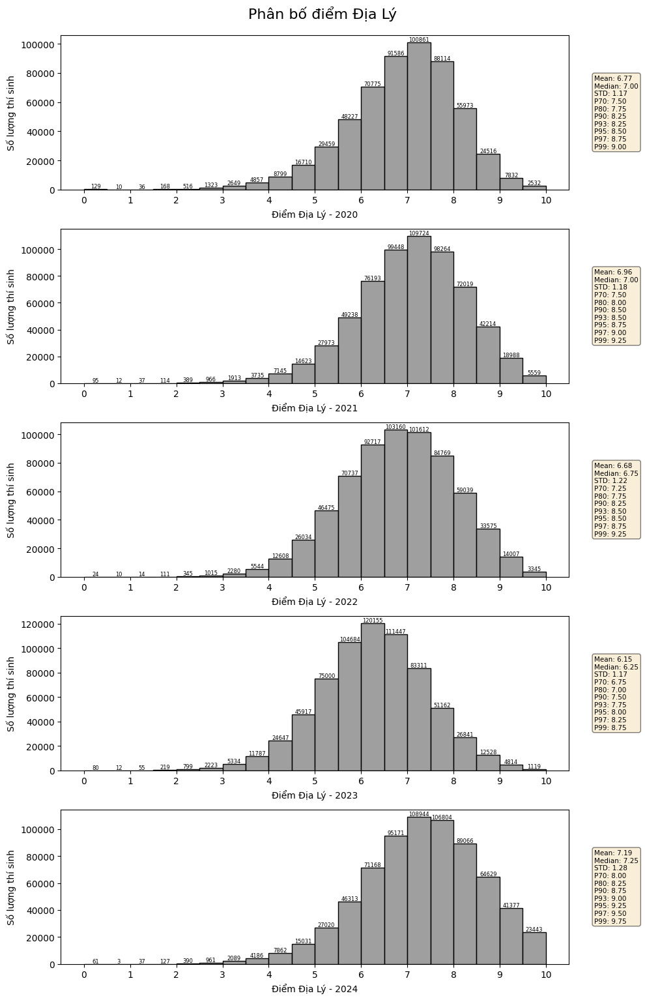

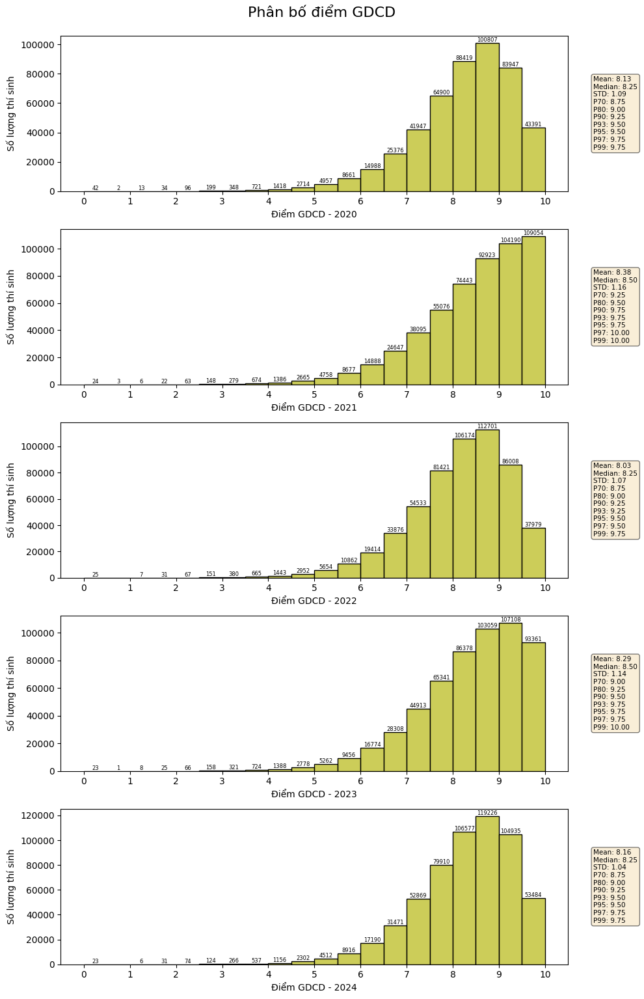

In [ ]:
# Giả sử bạn đã có dữ liệu trong df_data_map
data = df_data_map

# Chuẩn bị dữ liệu
recent_years, recent_years_sorted = prepare_recent_years_data(data)

# Phân tích các môn
subjects, titles = prepare_subject_title()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']

# Vẽ biểu đồ cho từng môn học: Với mỗi môn học (Toán, Văn, Lý...), vẽ biểu đồ phân phối điểm từ 2020–2024
for subject, title, color in zip(subjects, titles, colors):
    plt.figure(figsize=(10, 15))
    # Trong mỗi môn, vẽ 5 biểu đồ con – 1 biểu đồ cho mỗi năm => Dùng plt.subplot(5,1,i+1) để chia trang thành 5 phần dọc và dropna(): loại điểm bị thiếu
    for i, year in enumerate(recent_years_sorted):
        # Tạo ra một list chứa các số nguyên từ 0 đến 10
        score = list(range(0, 11, 1))
        plt.subplot(5, 1, i + 1)    
        year_data = recent_years[recent_years['year'] == year][subject].dropna()  

        # Vẽ histogram: histplot(): vẽ biểu đồ cột phân phối điểm, bins=20: chia dữ liệu thành 20 khoảng điểm, edgecolor='black': viền đen đẹp hơn, gca(): lấy biểu đồ hiện tại để chỉnh sửa thêm
        hist = sns.histplot(year_data, bins=20, kde=False, color=color, edgecolor='black')
        # Lấy đối tượng tục hiện tại
        ax = plt.gca()

        # Thiết lập tiêu đề và nhãn cho trục
        plt.xlabel(f'Điểm {title} - {year}')
        plt.ylabel('Số lượng thí sinh')
        
        # Thêm số lượng trên các cột
        add_labels_to_histogram(hist, ax)

        # Tính toán thông tin thống kê
        add_statistical_info(year_data)
        
        plt.xticks(score)
    #  Hiển thị tiêu đề lớn trên cùng và toàn bộ biểu đồ
    plt.tight_layout()
    plt.suptitle(f'Phân bố điểm {title}', fontsize=16, y=1.02)
    plt.show()

Phân phối điểm từng môn học: Hiển thị biểu đồ đường mượt (KDE) để so sánh hình dạng phân phối điểm của mỗi môn theo từng năm

In [ ]:
# Chọn ngẫu nhiên 30% dữ liệu từ toàn bộ df_data_map
sampled_data = df_data_map.sample(frac = 0.3, random_state = 1)

In [30]:
sampled_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1481095 entries, 2201011 to 3906872
Data columns (total 14 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   sbd           1481095 non-null  int64  
 1   toan          1462535 non-null  float64
 2   ngu_van       1461227 non-null  float64
 3   ngoai_ngu     1290965 non-null  float64
 4   vat_li        491001 non-null   float64
 5   hoa_hoc       493244 non-null   float64
 6   sinh_hoc      486290 non-null   float64
 7   lich_su       975735 non-null   float64
 8   dia_li        968343 non-null   float64
 9   gdcd          815093 non-null   float64
 10  ma_ngoai_ngu  1393699 non-null  object 
 11  year          1481095 non-null  int64  
 12  code          1481095 non-null  object 
 13  province      1481095 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 169.5+ MB


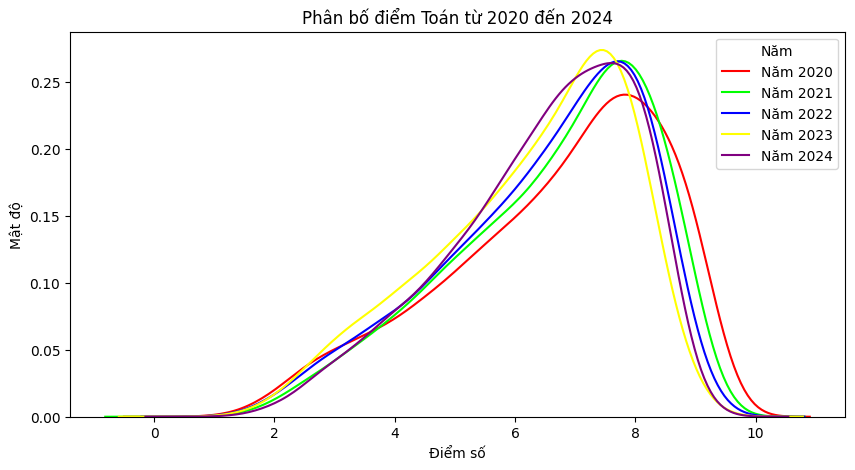

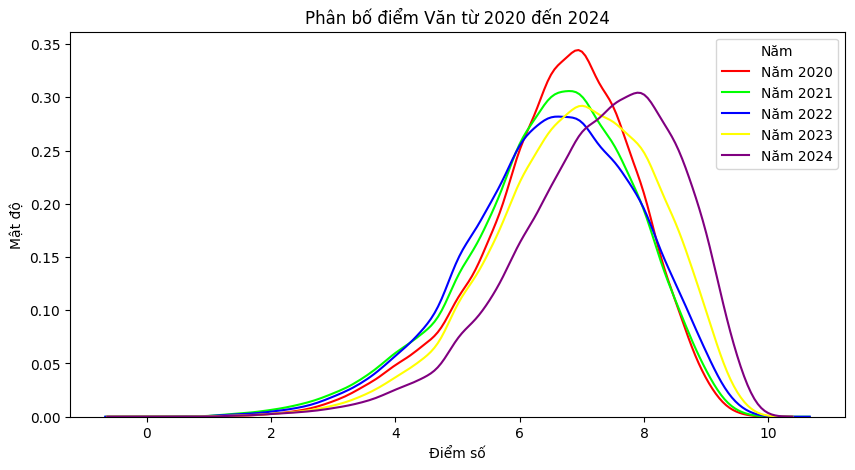

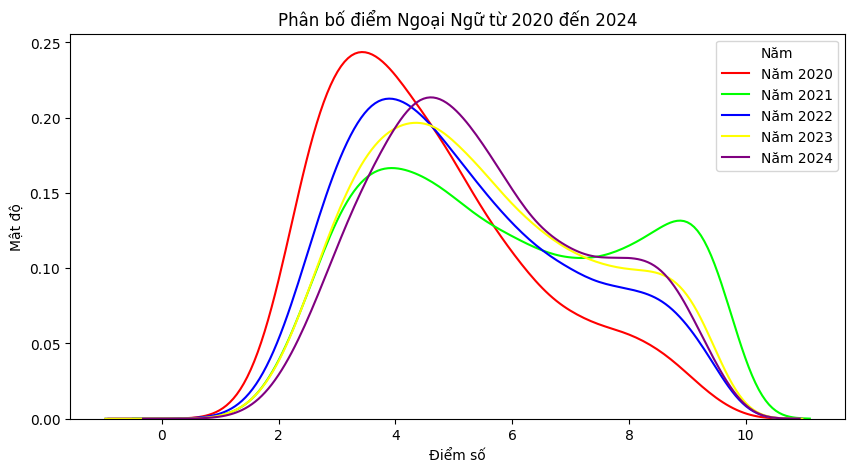

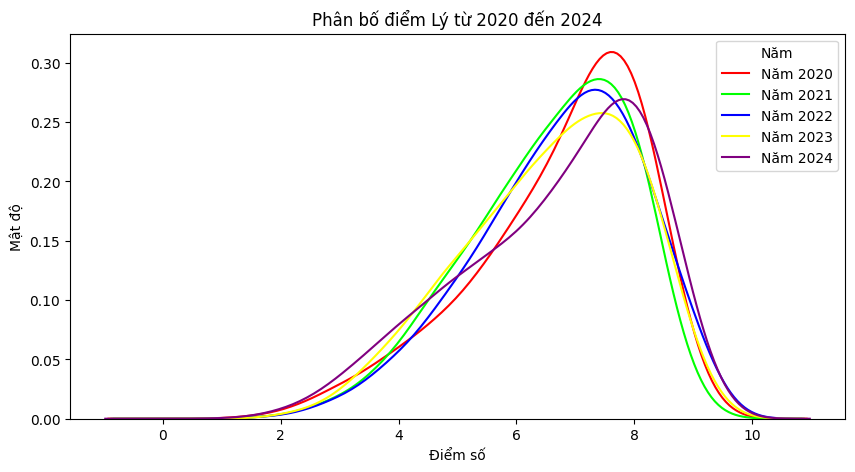

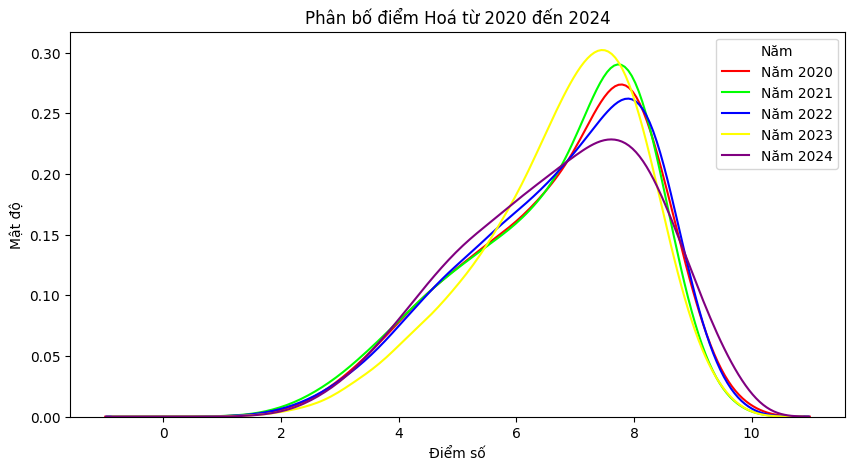

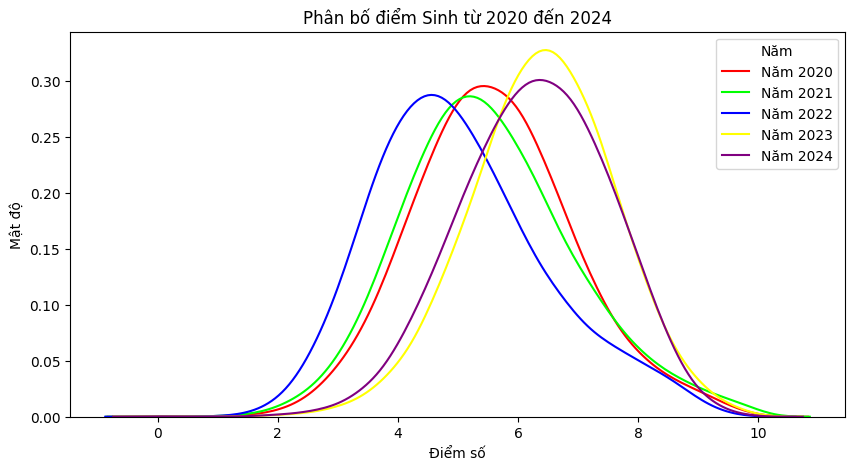

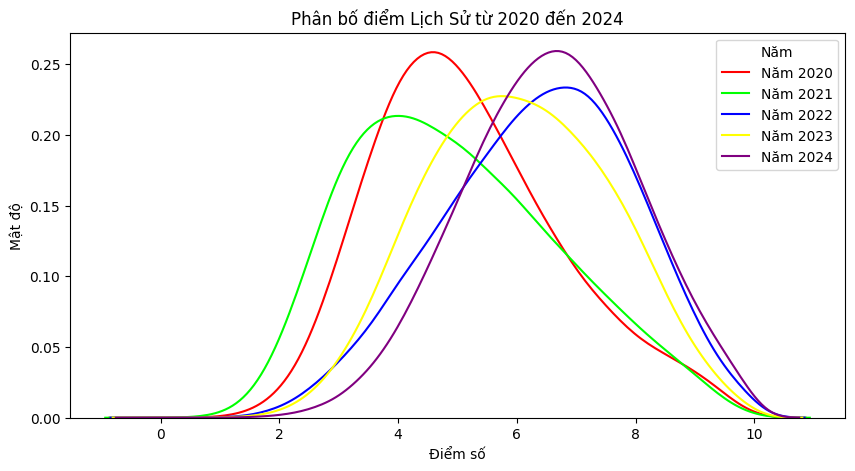

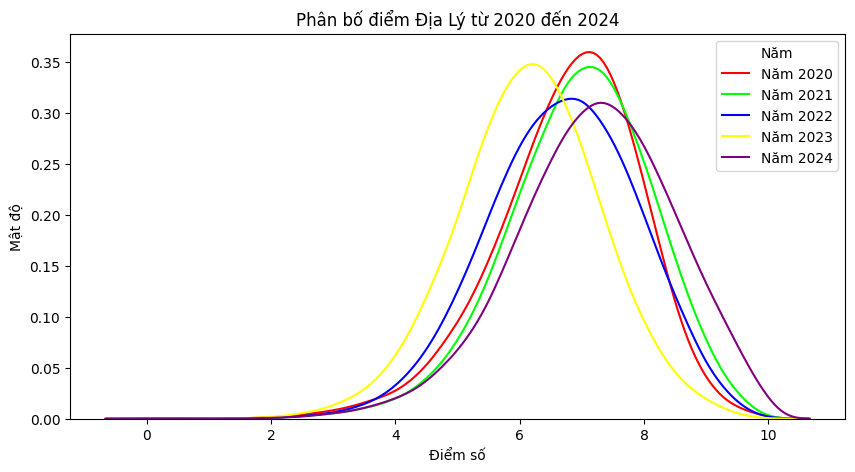

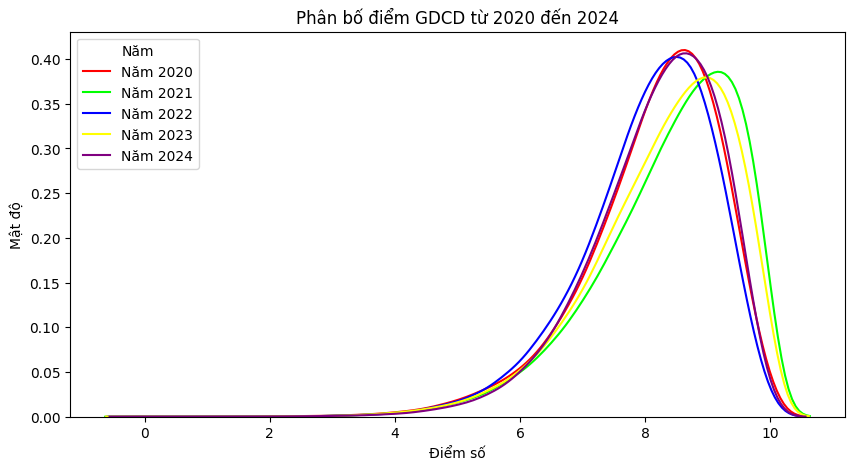

In [ ]:
# Lọc dữ liệu từ các năm
years = [2020, 2021, 2022, 2023, 2024]
df_filtered = sampled_data[sampled_data['year'].isin(years)]

# Chuẩn bị thông tin môn học & màu sắc
# Lấy tên các môn (toan, hoa_hoc,...) và tiêu đề đẹp (Toán, Hóa,...).
subjects, titles = prepare_subject_title()
# Chọn màu sắc để phân biệt từng năm
colors = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#800080']
# Sắp xếp các năm theo thứ tự tăng dần
recent_years_sorted = sorted(recent_years['year'].unique())

# Vẽ biểu đồ cho từng môn
## Với mỗi môn: Tạo biểu đồ đường KDE (mềm mượt hơn histogram), So sánh hình dạng phân phối điểm theo từng năm, bw_adjust=2: điều chỉnh độ mượt, số càng cao càng "tròn"
for subject, title in zip(subjects, titles):
    plt.figure(figsize=(10, 5))
    for year, color in zip(years, colors):
        data = df_filtered[df_filtered['year'] == year][subject].dropna()
        if not data.empty:  # Kiểm tra nếu dữ liệu không rỗng
            sns.kdeplot(data, label=f'Năm {year}', color=color, bw_adjust=2)
        else:
            print('Không tìm thấy dữ liệu cho {title} năm {year}')
    plt.title(f'Phân bố điểm {title} từ 2020 đến 2024')
    plt.xlabel('Điểm số')
    plt.ylabel('Mật độ')
    plt.legend(title='Năm')
    plt.grid(False)
    plt.show()

Phân phối điểm tổ hợp môn (tổng điểm) => dùng để xét tuyển đại học theo từng năm

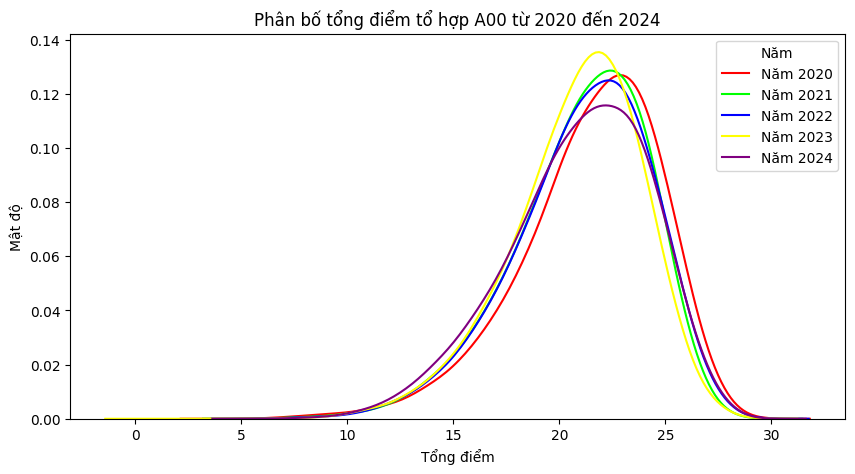

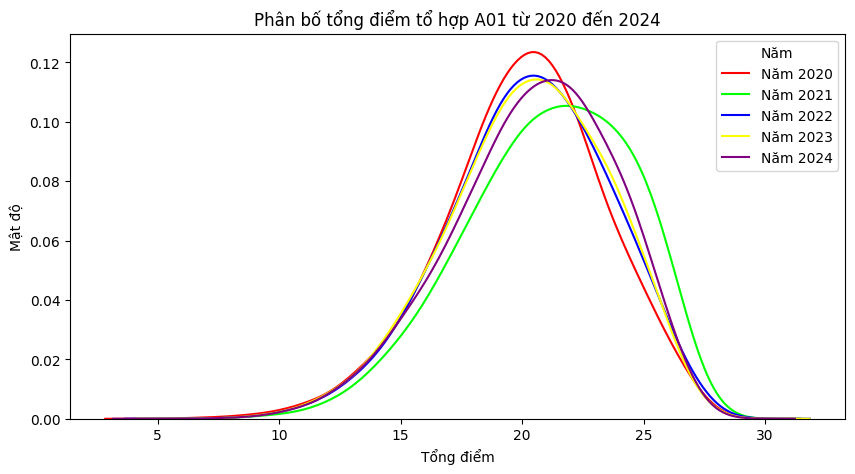

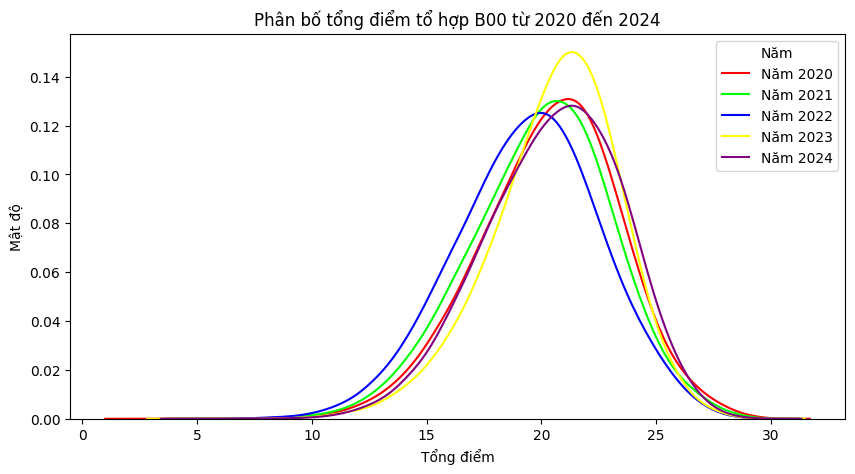

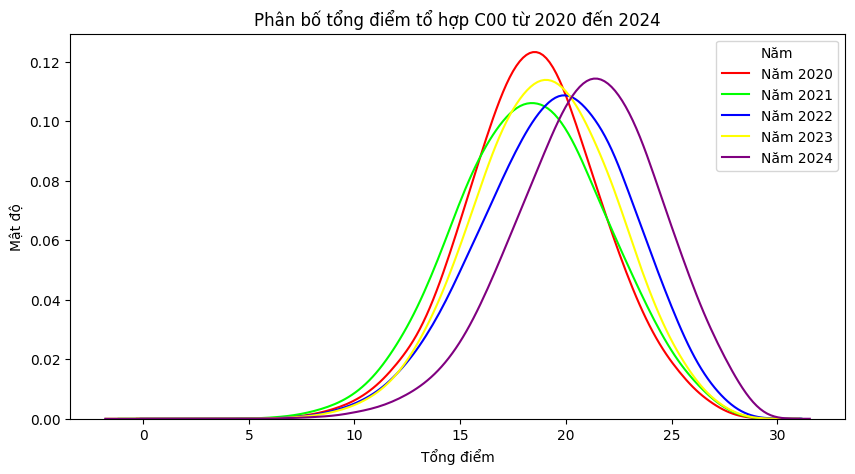

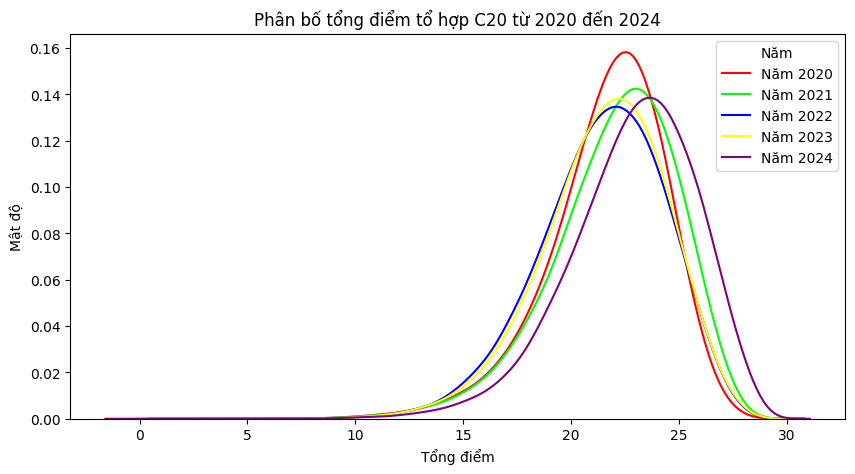

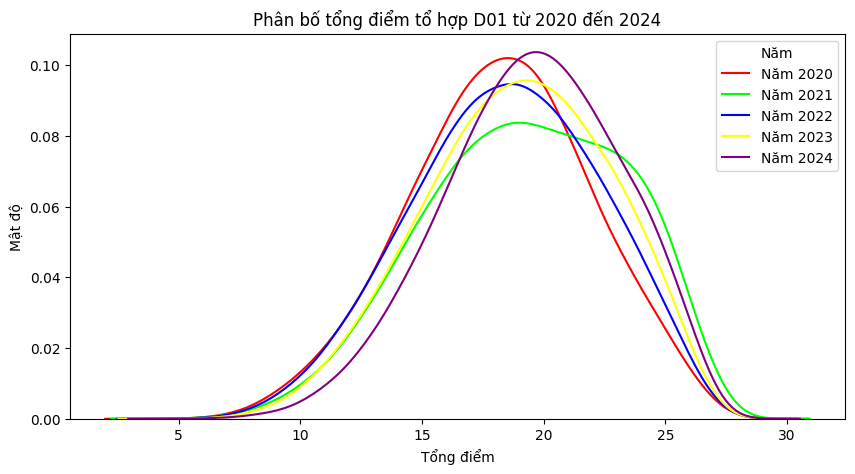

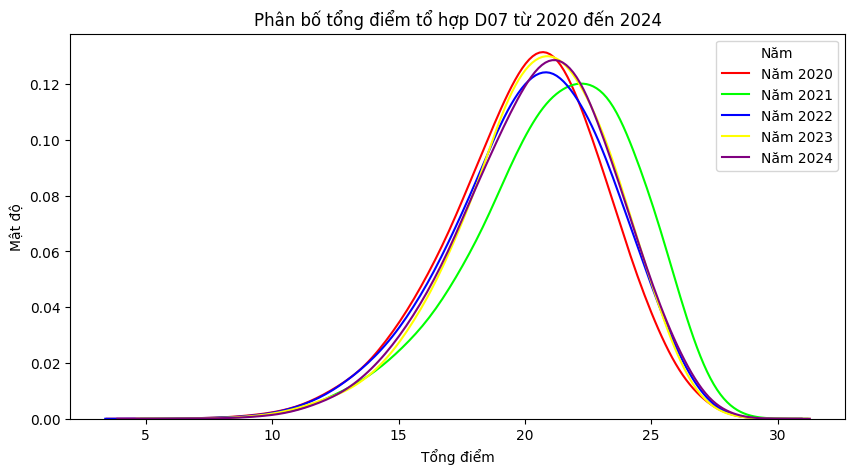

In [ ]:
years = [2020, 2021, 2022, 2023, 2024]
df_filtered = sampled_data[sampled_data['year'].isin(years)]

# Tổng điểm các môn cần phân tích: Tạo thêm cột mới trong dataframe cho mỗi tổ hợp
df_filtered['A00'] = df_filtered['toan'] + df_filtered['vat_li'] + df_filtered['hoa_hoc']
df_filtered['A01'] = df_filtered['toan'] + df_filtered['vat_li'] + df_filtered['ngoai_ngu']
df_filtered['B00'] = df_filtered['toan'] + df_filtered['hoa_hoc'] + df_filtered['sinh_hoc']
df_filtered['C00'] = df_filtered['ngu_van'] + df_filtered['lich_su'] + df_filtered['dia_li']
df_filtered['C20'] = df_filtered['ngu_van'] + df_filtered['dia_li'] + df_filtered['gdcd']
df_filtered['D01'] = df_filtered['toan'] + df_filtered['ngoai_ngu'] + df_filtered['ngu_van']
df_filtered['D07'] = df_filtered['toan'] + df_filtered['ngoai_ngu'] + df_filtered['hoa_hoc']

# Các tổ hợp môn cần phân tích
combinations = ['A00', 'A01', 'B00', 'C00', 'C20', 'D01', 'D07']

# Thiết lập các cài đặt cho biểu đồ
colors = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#800080']

# Vẽ histogram cho từng tổ hợp môn
## Với mỗi tổ hợp môn: Vẽ đường KDE của tổng điểm cho từng năm, So sánh hình dạng, độ lệch, độ rộng phân phối
for combo in combinations:
    plt.figure(figsize=(10, 5))
    for year, color in zip(years, colors):
        data = df_filtered[df_filtered['year'] == year][combo].dropna()
        sns.kdeplot(data, label=f'Năm {year}', color=color, bw_adjust=2)
    plt.title(f'Phân bố tổng điểm tổ hợp {combo} từ 2020 đến 2024')
    plt.xlabel('Tổng điểm')
    plt.ylabel('Mật độ')
    plt.legend(title='Năm')
    plt.grid(False)
    plt.show()


Phân tích sâu từng tổ hợp xét tuyển đại học => vẽ histogram

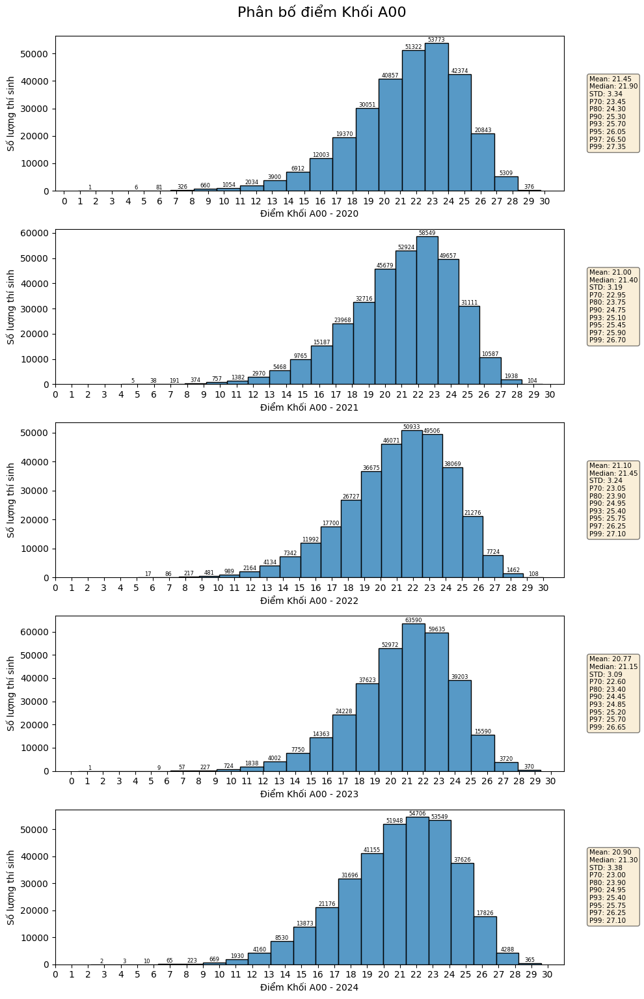

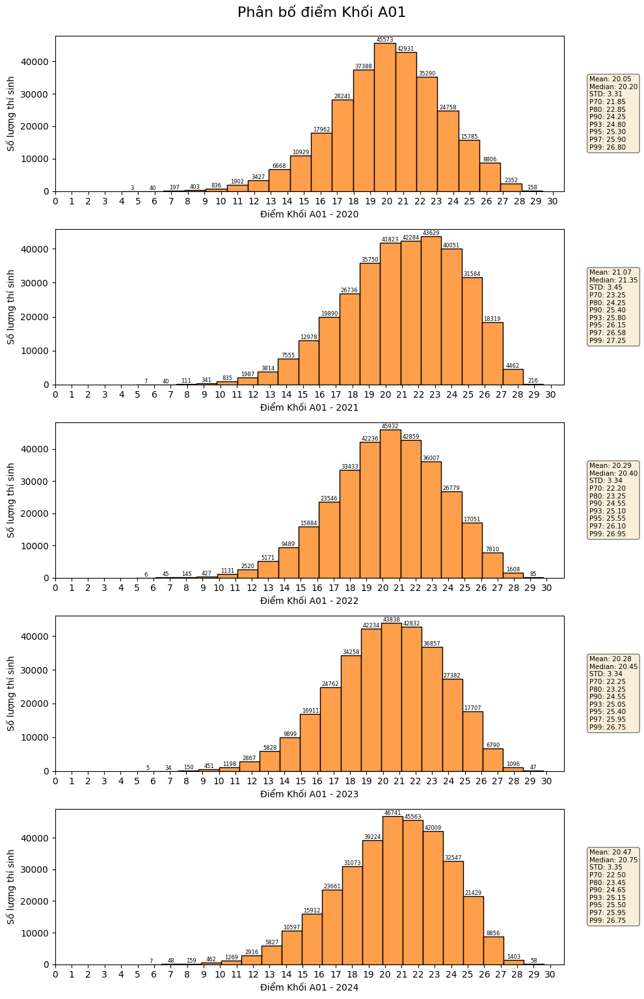

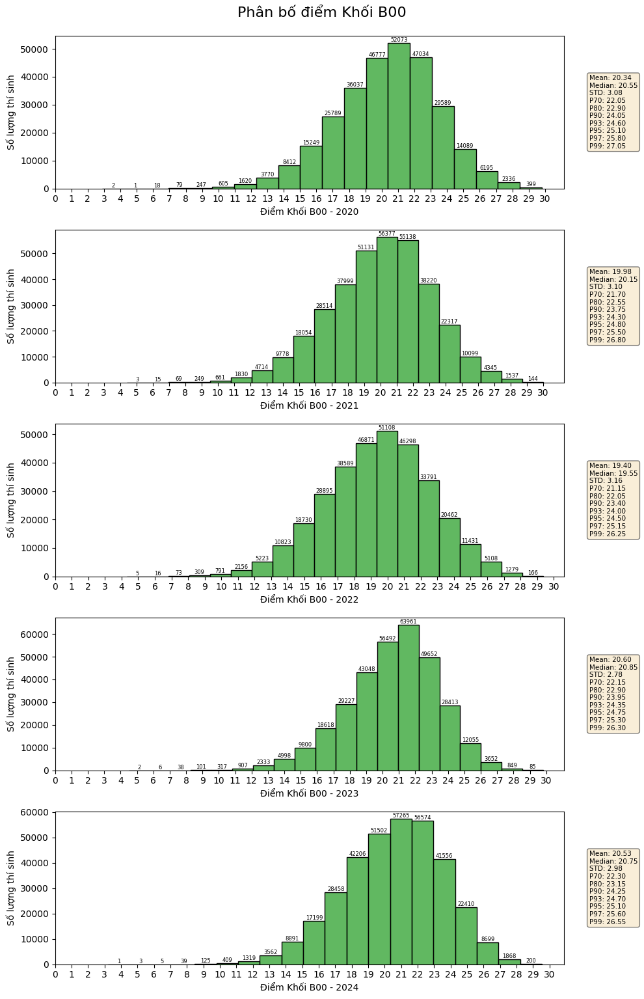

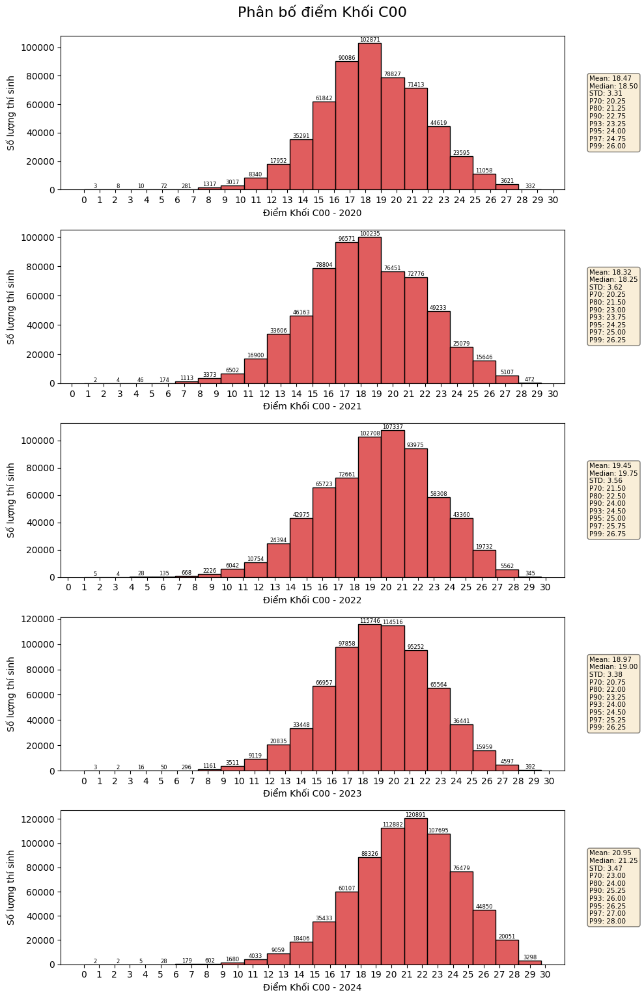

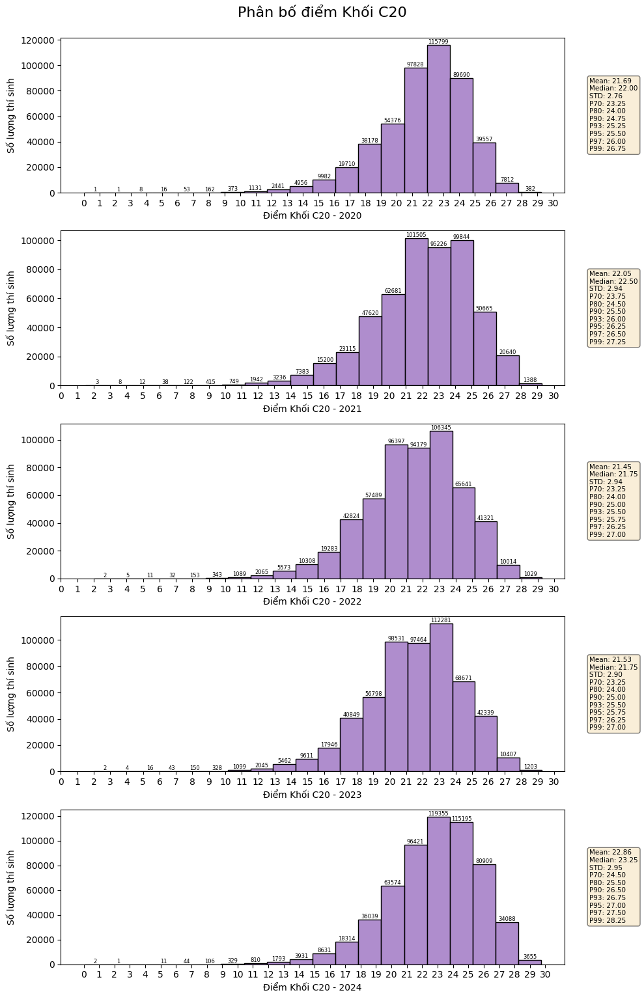

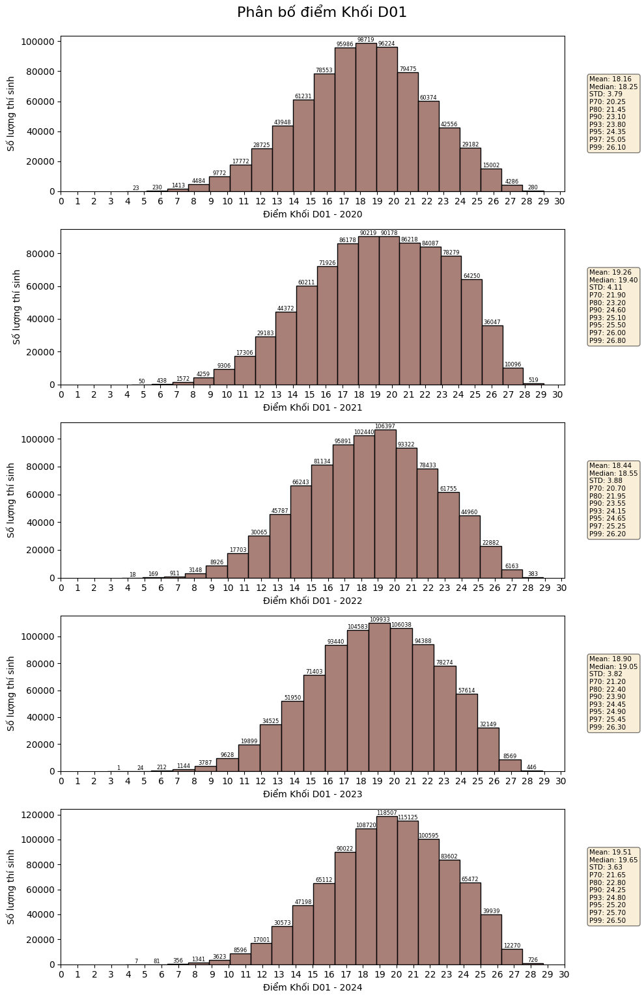

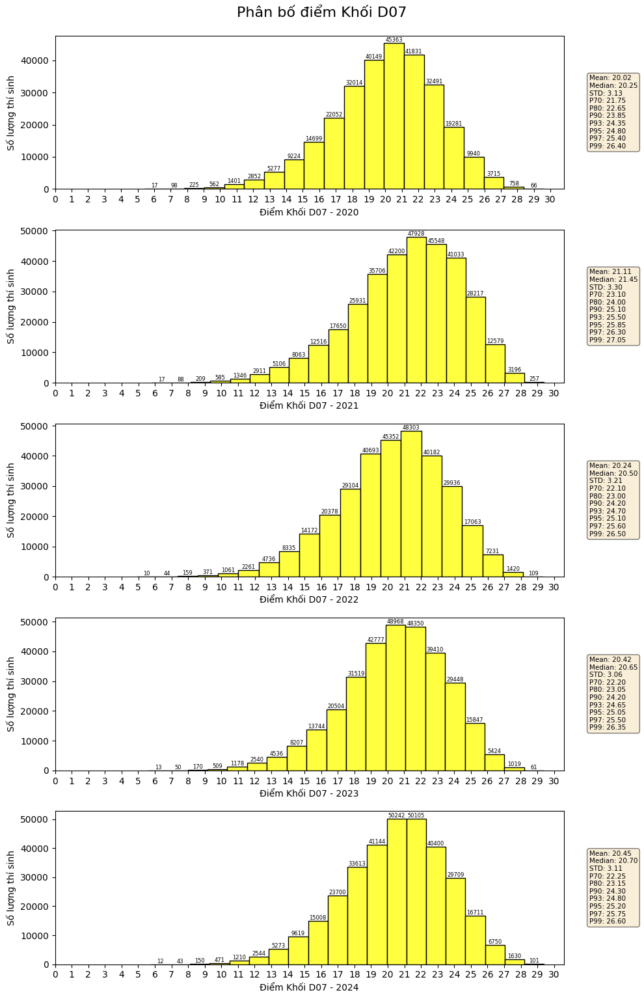

In [ ]:
data = df_data_map

# Tính điểm cho các tổ hợp môn
df_data_map['A00'] = df_data_map['toan'] + df_data_map['vat_li'] + df_data_map['hoa_hoc']
df_data_map['A01'] = df_data_map['toan'] + df_data_map['vat_li'] + df_data_map['ngoai_ngu']
df_data_map['B00'] = df_data_map['toan'] + df_data_map['hoa_hoc'] + df_data_map['sinh_hoc']
df_data_map['C00'] = df_data_map['ngu_van'] + df_data_map['lich_su'] + df_data_map['dia_li']
df_data_map['C20'] = df_data_map['ngu_van'] + df_data_map['dia_li'] + df_data_map['gdcd']
df_data_map['D01'] = df_data_map['toan'] + df_data_map['ngoai_ngu'] + df_data_map['ngu_van']
df_data_map['D07'] = df_data_map['toan'] + df_data_map['ngoai_ngu'] + df_data_map['hoa_hoc']

# Định nghĩa tổ hợp và màu sắc hiển thị
subject_combinations = {
    'A00': ('Khối A00', '#1f77b4'),
    'A01': ('Khối A01', '#ff7f0e'),
    'B00': ('Khối B00', '#2ca02c'),
    'C00': ('Khối C00', '#d62728'),
    'C20': ('Khối C20', '#9467bd'),
    'D01': ('Khối D01', '#8c564b'),
    'D07': ('Khối D07', '#FFFF00')
}

# Các năm cần phân tích
years = [2020, 2021, 2022, 2023, 2024]

# Lọc dữ liệu theo năm
# recent_years, recent_years_sorted = prepare_recent_years_data(data)
recent_years, recent_years_sorted = prepare_recent_years_data(data)

# Tính toán các thông số thống kê: Với các tổ hợp bạn chọn phân tích kỹ (A00, A01, D01, D07)
statistical_info = {} # Kết quả được lưu vào từ điển statistical_info
for subject, (title, color) in subject_combinations.items():
    if subject in ['A00', 'A01', 'D01', 'D07']:
        year_data_list = []
        for year in recent_years_sorted:
            year_data = recent_years[recent_years['year'] == year][subject].dropna()
            year_data_list.append(year_data)
        statistical_info[subject] = {
            'mean': [data.mean() for data in year_data_list],
            'median': [data.median() for data in year_data_list],
            'p95': [data.quantile(0.95) for data in year_data_list]
        }
    
    # Tạo biểu đồ cho từng tổ hợp môn
    plt.figure(figsize=(10, 15))
    # Vẽ biểu đồ cho từng năm
    ## tạo 1 hình gồm 5 biểu đồ con, mỗi cái tương ứng 1 năm: Dùng sns.histplot để vẽ histogram, Dữ liệu lấy từ recent_years, lọc theo năm và tổ hợp
    for i, year in enumerate(recent_years_sorted):
        plt.subplot(5, 1, i + 1)
        score = list(range(0, 31, 1))
        year_data = recent_years[recent_years['year'] == year][subject].dropna()
        hist = sns.histplot(year_data, bins=20, kde=False, color=color, edgecolor='black')
        
        # Thiết lập tiêu đề và nhãn cho trục
        plt.xlabel(f'Điểm {title} - {year}')
        plt.ylabel('Số lượng thí sinh')
        # Lấy đối tượng trục hiện tại
        ax = plt.gca()

        # hiển thị số lượng thí sinh ngay trên từng cột
        add_labels_to_histogram(hist, ax)
        # hiển thị hộp thống kê nhỏ bên cạnh biểu đồ
        add_statistical_info(year_data)
        # giới hạn trục x từ 0 đến 30
        plt.xticks(score)
    plt.tight_layout()
    # tiêu đề lớn cho toàn bộ 5 biểu đồ
    plt.suptitle(f'Phân bố điểm {title}', fontsize=16, y=1.02)
    plt.show()


Tổng số thí sinh và tỷ lệ tăng trưởng của các khối xét tuyển đại học qua các năm 2020–2024

Tổng số thí sinh của A00 qua các năm: [np.int64(291252), np.int64(343370), np.int64(323673), np.int64(325902), np.int64(343800)]
Tổng số thí sinh của A01 qua các năm: [np.int64(283649), np.int64(332412), np.int64(312164), np.int64(315146), np.int64(329761)]
Tổng số thí sinh của B00 qua các năm: [np.int64(290321), np.int64(341194), np.int64(322124), np.int64(324554), np.int64(342291)]
Tổng số thí sinh của C00 qua các năm: [np.int64(554555), np.int64(628257), np.int64(656942), np.int64(681723), np.int64(704008)]
Tổng số thí sinh của C20 qua các năm: [np.int64(482456), np.int64(531792), np.int64(554103), np.int64(565249), np.int64(583208)]
Tổng số thí sinh của D01 qua các năm: [np.int64(768235), np.int64(864694), np.int64(866730), np.int64(878007), np.int64(908866)]
Tổng số thí sinh của D07 qua các năm: [np.int64(282015), np.int64(331086), np.int64(310920), np.int64(314274), np.int64(328435)]
Tỷ lệ tăng trưởng của A00 qua các năm: [np.float64(17.894469394201586), np.float64(-5.73637766840

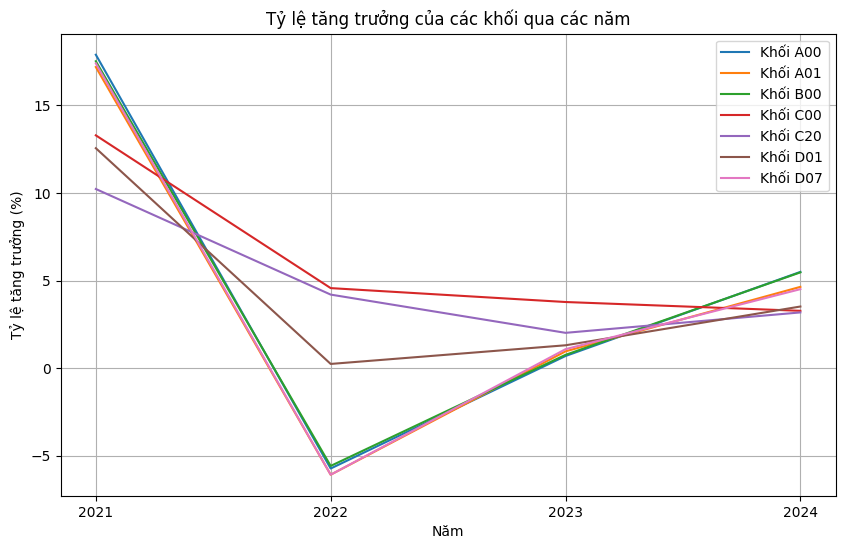

In [ ]:
# Tạo dictionary để lưu trữ tổng số thí sinh của từng khối qua các năm
total_students_per_subject = {}
# Chuyển đổi cột 'year' về dạng số nguyên
df_data_map['year'] = df_data_map['year'].astype(int)

# Vòng lặp qua các tổ hợp môn: Tổng số thí sinh
## Với mỗi khối (A00, D01...), đếm số thí sinh có điểm tổ hợp (tức là không bị thiếu điểm nào trong tổ hợp đó)
for subject, (title, _) in subject_combinations.items():
    yearly_totals = []
    
    # Lặp qua từng năm => có danh sách tổng số thí sinh của từng khối
    for year in recent_years_sorted:
        year_data = recent_years[recent_years['year'] == year][subject].dropna()
        
        # Tính tổng số thí sinh cho khối này trong năm đó
        total_students = year_data.count()
        yearly_totals.append(total_students)
    
    # Lưu vào dictionary
    total_students_per_subject[subject] = yearly_totals

# Vẽ biểu đồ tỷ lệ tăng trưởng: Hiển thị tổng số thí sinh qua các năm
## Trục X: các năm từ 2021 đến 2024
## Trục Y: tỷ lệ tăng trưởng
for subject, totals in total_students_per_subject.items():
    print(f"Tổng số thí sinh của {subject} qua các năm: {totals}")

# Tạo dictionary để lưu trữ tỷ lệ tăng trưởng của từng khối qua các năm
growth_rates = {}

# Vòng lặp qua các tổ hợp môn
for subject, totals in total_students_per_subject.items():
    growth_rate = []
    
    # Lặp qua từng năm, bắt đầu từ năm thứ hai
    for i in range(1, len(totals)):
        growth = ((totals[i] - totals[i - 1]) / totals[i - 1]) * 100
        growth_rate.append(growth)
    
    # Lưu vào dictionary
    growth_rates[subject] = growth_rate

# Hiển thị tỷ lệ tăng trưởng qua các năm
for subject, rates in growth_rates.items():
    print(f"Tỷ lệ tăng trưởng của {subject} qua các năm: {rates}")
    # Vẽ biểu đồ tỷ lệ tăng trưởng
plt.figure(figsize=(10, 6))

for subject, rates in growth_rates.items():
    plt.plot(recent_years_sorted[1:], rates, label=subject_combinations[subject][0])

plt.xlabel('Năm')
plt.ylabel('Tỷ lệ tăng trưởng (%)')
plt.title('Tỷ lệ tăng trưởng của các khối qua các năm')
plt.legend()
plt.grid(True)
plt.xticks(recent_years_sorted[1:], labels=[str(int(year)) for year in recent_years_sorted[1:]])
plt.show()

Ước lượng

Phân tích so sánh phân phối điểm số trong khoảng 20 – 30 điểm cho từng khối thi (A00, A01, …) qua 5 năm bằng biểu đồ cột nhóm\ tính toán sự chênh lệch trung bình và khoảng tin cậy 95% giữa các năm

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp A00:
Sự chênh lệch trung bình giữa 2021 và 2020: 1085.30
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4221.776909855111), np.float64(6392.376909855109))
Sự chênh lệch trung bình giữa 2022 và 2021: -608.95
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-6176.586714010755), np.float64(4958.686714010757))
Sự chênh lệch trung bình giữa 2023 và 2022: -383.20
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-5866.617641937114), np.float64(5100.217641937113))
Sự chênh lệch trung bình giữa 2024 và 2023: 550.95
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4917.728127825684), np.float64(6019.628127825686))


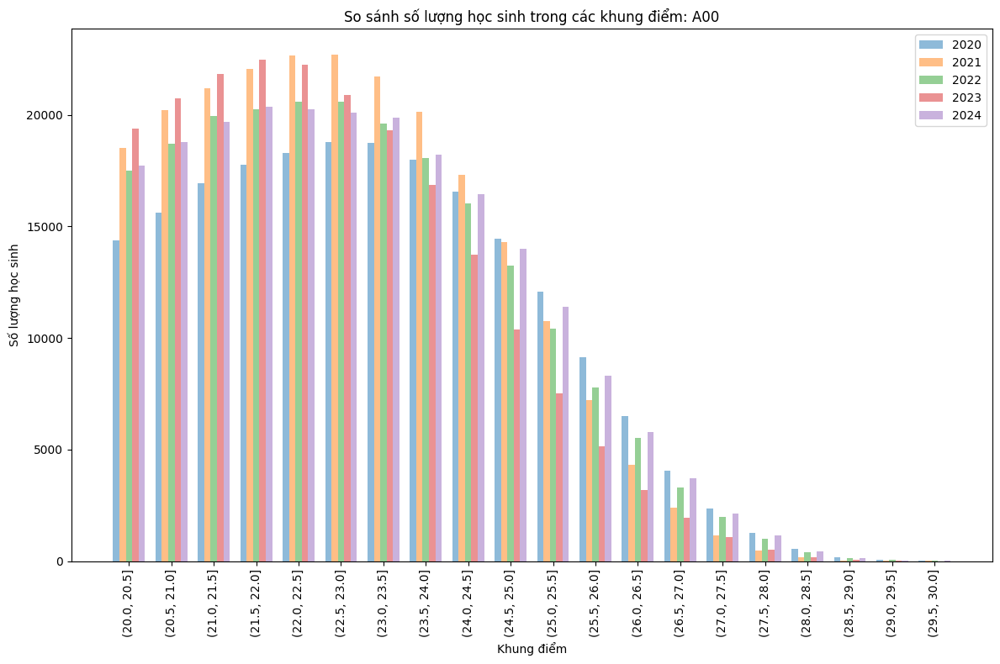

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp A01:
Sự chênh lệch trung bình giữa 2021 và 2020: 3156.90
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-1161.7275362321434), np.float64(7475.527536232143))
Sự chênh lệch trung bình giữa 2022 và 2021: -2016.10
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-6457.570373223776), np.float64(2425.3703732237755))
Sự chênh lệch trung bình giữa 2023 và 2022: 106.95
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4304.28866062416), np.float64(4518.1886606241615))
Sự chênh lệch trung bình giữa 2024 và 2023: 934.65
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-3726.0870004406124), np.float64(5595.387000440612))


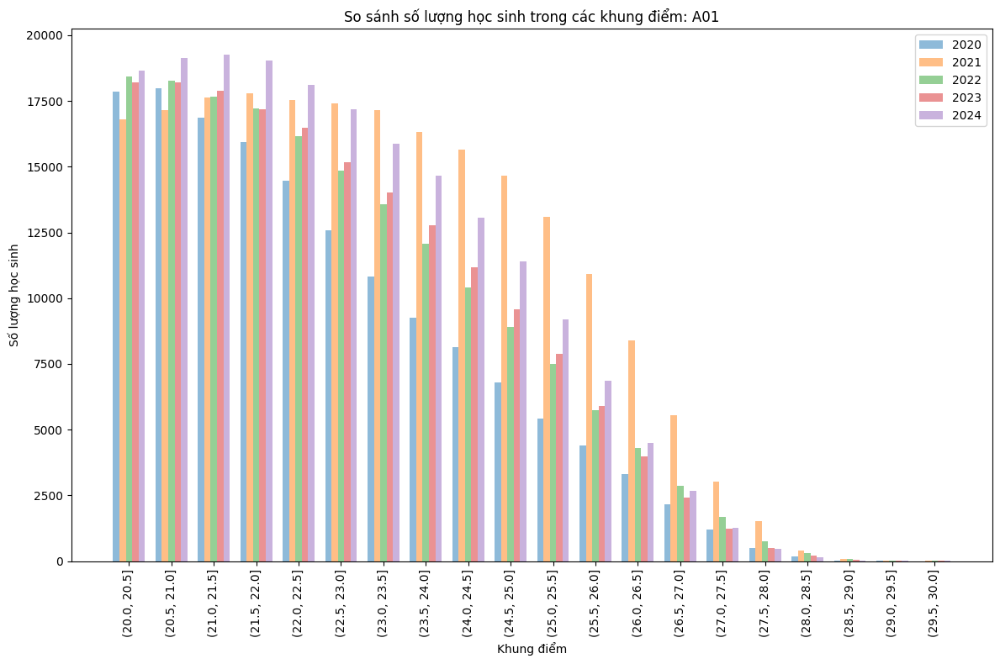

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp B00:
Sự chênh lệch trung bình giữa 2021 và 2020: 626.85
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4510.178430730398), np.float64(5763.878430730399))
Sự chênh lệch trung bình giữa 2022 và 2021: -1795.70
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-6824.480608055007), np.float64(3233.0806080550055))
Sự chênh lệch trung bình giữa 2023 và 2022: 2973.00
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-2506.6489055881875), np.float64(8452.648905588187))
Sự chênh lệch trung bình giữa 2024 và 2023: 19.35
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-5958.231415499317), np.float64(5996.931415499318))


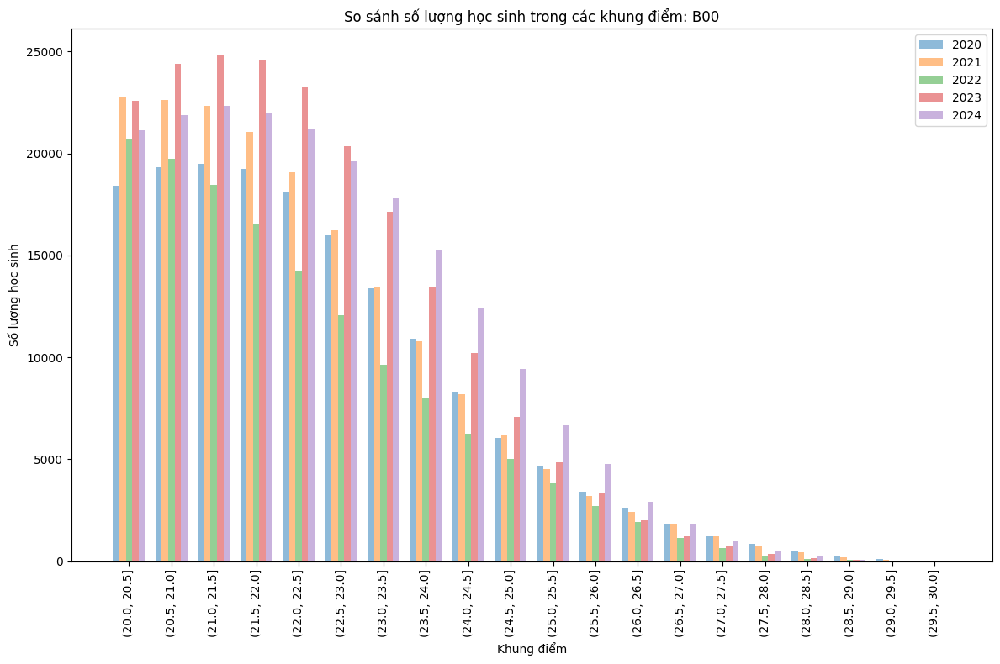

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp C00:
Sự chênh lệch trung bình giữa 2021 và 2020: 1425.40
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4518.180774511146), np.float64(7368.980774511146))
Sự chênh lệch trung bình giữa 2022 và 2021: 4739.35
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-2541.7498701215463), np.float64(12020.449870121547))
Sự chênh lệch trung bình giữa 2023 và 2022: -1881.95
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-10009.02645379178), np.float64(6245.126453791781))
Sự chênh lệch trung bình giữa 2024 và 2023: 8866.65
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(42.92841998696713), np.float64(17690.37158001303))


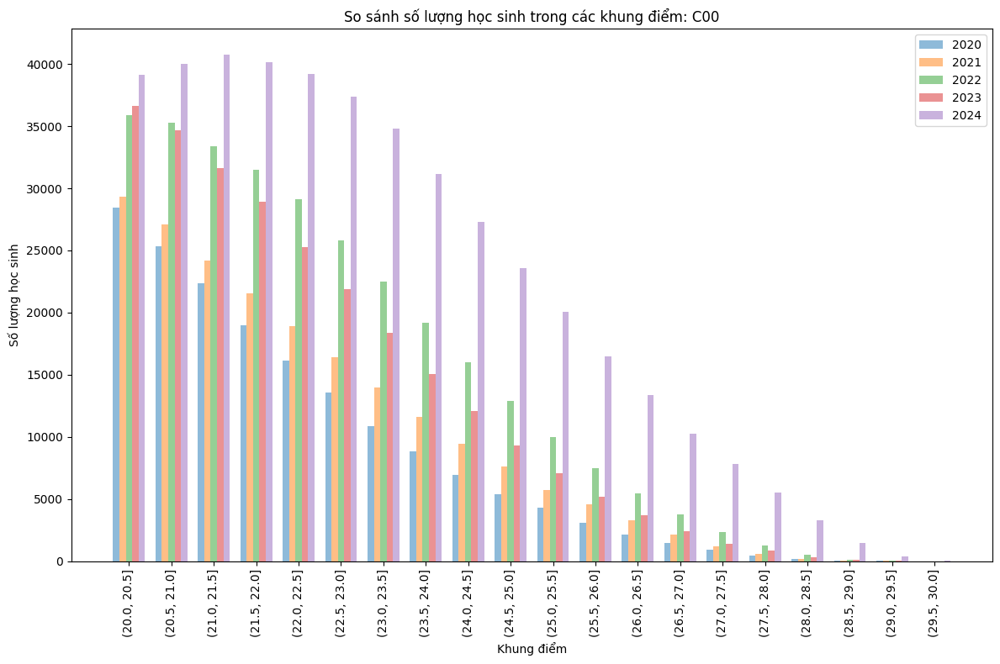

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp C20:
Sự chênh lệch trung bình giữa 2021 và 2020: 2273.50
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-7314.182047364202), np.float64(11861.182047364202))
Sự chênh lệch trung bình giữa 2022 và 2021: -1191.90
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-10686.04656204142), np.float64(8302.246562041417))
Sự chênh lệch trung bình giữa 2023 và 2022: 794.00
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-9009.029386909731), np.float64(10597.029386909731))
Sự chênh lệch trung bình giữa 2024 và 2023: 4189.15
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-5354.690321102173), np.float64(13732.990321102176))


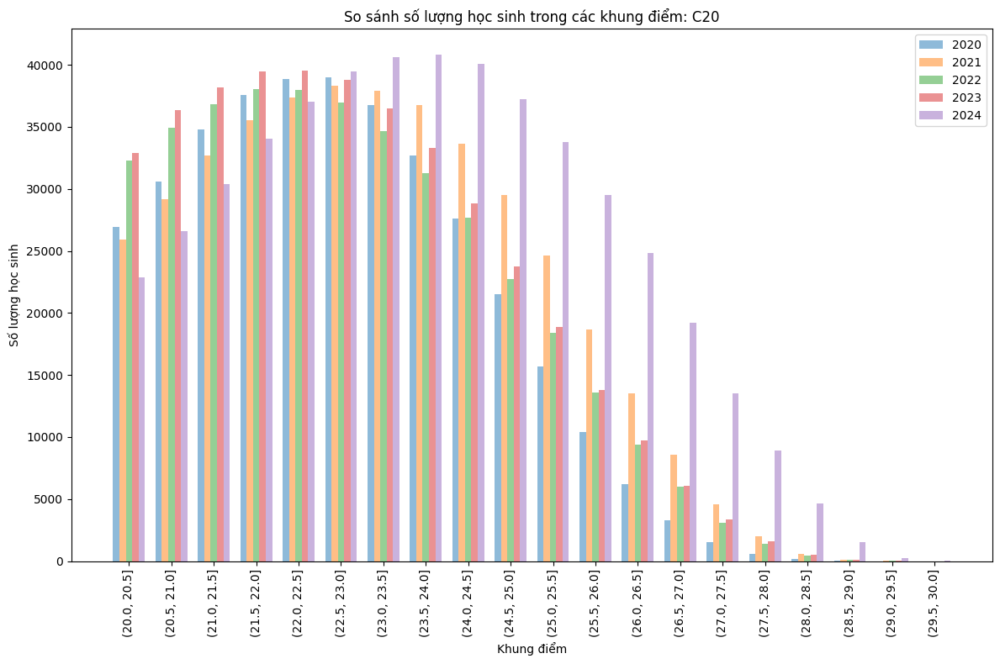

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp D01:
Sự chênh lệch trung bình giữa 2021 và 2020: 7115.35
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-1122.2389325072854), np.float64(15352.93893250729))
Sự chênh lệch trung bình giữa 2022 và 2021: -3822.80
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-12711.767756779047), np.float64(5066.167756779045))
Sự chênh lệch trung bình giữa 2023 và 2022: 2228.30
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-7003.9045232892695), np.float64(11460.504523289272))
Sự chênh lệch trung bình giữa 2024 và 2023: 3081.05
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-7240.273028277945), np.float64(13402.373028277943))


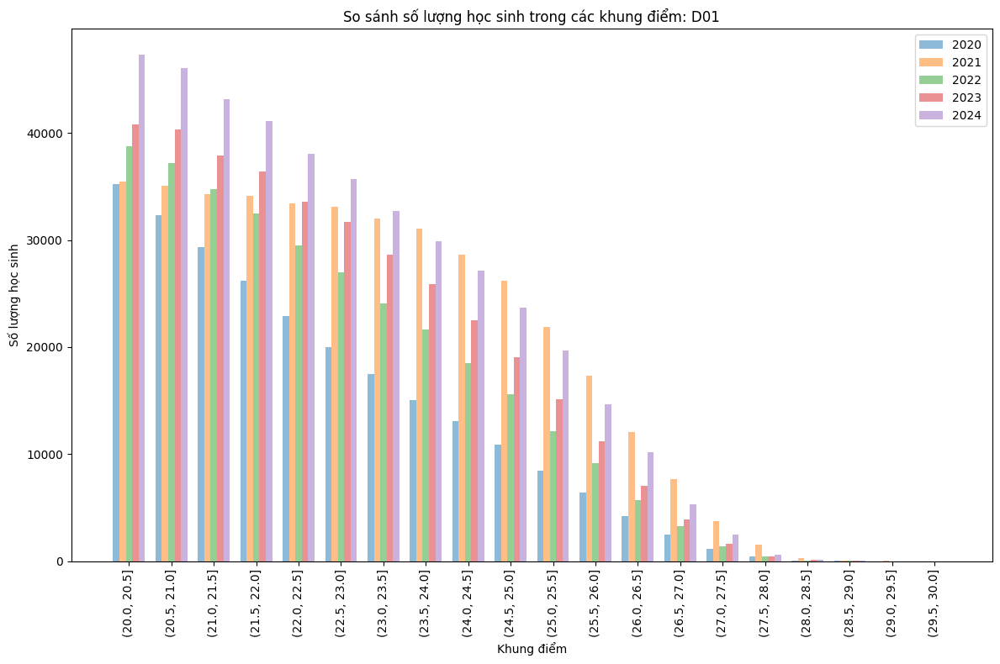

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_year['bins'] = pd.cut(df_year[comb], bins)
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\1763768185.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

Tổ hợp D07:
Sự chênh lệch trung bình giữa 2021 và 2020: 3473.55
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-1409.950290428228), np.float64(8357.05029042823))
Sự chênh lệch trung bình giữa 2022 và 2021: -2308.75
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-7338.852820425976), np.float64(2721.3528204259756))
Sự chênh lệch trung bình giữa 2023 và 2022: 481.75
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4583.967309178165), np.float64(5547.467309178165))
Sự chênh lệch trung bình giữa 2024 và 2023: 449.85
Khoảng tin cậy 95% cho sự chênh lệch trung bình: (np.float64(-4845.6288921910655), np.float64(5745.328892191063))


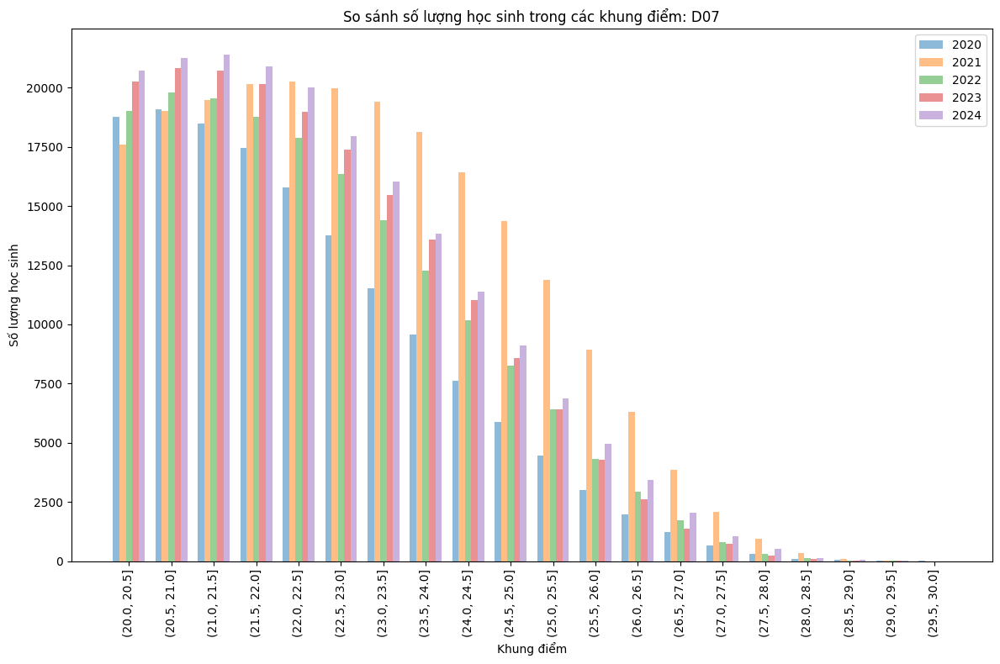

In [ ]:
# Cài đặt các khối và năm phân tích: 7 tổ hợp khối trong 5 năm
combinations = ['A00', 'A01', 'B00', 'C00', 'C20', 'D01', 'D07']
years = [2020, 2021, 2022, 2023, 2024]

# Tạo khung điểm: Chia khung điểm từ 20 đến 30 (Mỗi học sinh sẽ được “rơi” vào một khung điểm nào đó tuỳ theo tổng điểm tổ hợp)
## Tạo các khung điểm: 20.0 → 20.5 → 21.0 … đến 30.0
bins = np.arange(20, 30.5, 0.5)

# Tạo khung dữ liệu mẫu để kiểm tra (thay thế bằng dữ liệu thực tế)
# df_data_map = pd.DataFrame(...) # Dữ liệu thật của bạn

# Lặp qua từng khối để xử lý
## Mỗi vòng lặp sẽ: Tính số lượng thí sinh theo từng khung điểm cho từng năm, Tính sự chênh lệch trung bình và khoảng tin cậy giữa các năm, Vẽ biểu đồ cột nhóm
for comb in combinations:
    plt.figure(figsize=(12, 8))

    # Lưu trữ số lượng học sinh cho từng năm
    counts = []
    # Đếm số lượng học sinh trong mỗi khung điểm
    for year in years:
        # Lọc dữ liệu cho năm
        df_year = df_data_map[df_data_map['year'] == year].copy()

        # Tạo bảng điểm số lượng học sinh trong mỗi khung điểm
        df_year['bins'] = pd.cut(df_year[comb], bins) # chia dữ liệu điểm thành các “khoảng” (bins)
        count_year = df_year['bins'].value_counts().sort_index() # đếm xem có bao nhiêu học sinh trong mỗi bin và sắp xếp các bin theo thứ tự
        counts.append(count_year)

    # Tính độ chênh lệch giữa các năm
    # Tính độ chênh lệch và khoảng tin cậy giữa các năm
    print(f"Tổ hợp {comb}:")
    for i in range(len(years) - 1):
        # sự chênh lệch trung bình số thí sinh giữa 2 năm
        mean_diff = counts[i + 1].mean() - counts[i].mean()
        # độ lệch chuẩn của sự khác biệt
        std_diff = np.sqrt(counts[i + 1].var() + counts[i].var())
        # tính khoảng tin cậy 95% (nếu khoảng này không chứa 0, có thể sự khác biệt là đáng kể)
        confidence_interval = stats.norm.interval(0.95, loc=mean_diff, scale=std_diff / np.sqrt(len(counts[i])))

        print(f"Sự chênh lệch trung bình giữa {years[i + 1]} và {years[i]}: {mean_diff:.2f}")
        print(f"Khoảng tin cậy 95% cho sự chênh lệch trung bình: {confidence_interval}")
        
    # Vẽ biểu đồ cho từng năm (biểu đồ cột nhóm)
    x_labels = [str(bin) for bin in counts[0].index]  # Nhãn cho các khung điểm
    width = 0.15  # Độ rộng của cột
    # Mỗi năm là một màu, Mỗi cột thể hiện số học sinh trong khung điểm cụ thể, tạo biểu đồ cột nhóm để dễ so sánh
    for i, count_year in enumerate(counts):
        x_pos = np.arange(len(x_labels)) + (i * width)  # Vị trí của các cột
        plt.bar(x_pos, count_year.values, width=width, label=str(years[i]), alpha=0.5)

    plt.xlabel('Khung điểm')
    plt.ylabel('Số lượng học sinh')
    plt.title(f'So sánh số lượng học sinh trong các khung điểm: {comb}')
    plt.xticks(np.arange(len(x_labels)) + width * (len(years) - 1) / 2, x_labels, rotation='vertical')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

Phân tích Percentile (phân vị) cho các tổ hợp môn

In [ ]:
# Percentile
# Các tổ hợp môn cần phân tích
combinations = ['A00', 'A01', 'B00', 'C00', 'C20', 'D01', 'D07']
years = [2020, 2021, 2022, 2023, 2024]

# Các percentile cần tính toán: muốn theo dõi điểm số từ mức khá đến rất giỏi
percentiles = list(range(70, 101, 2))

# Tạo DataFrame để lưu kết quả: Tạo khung để lưu kết quả, mỗi dòng là 1 mức phân vị
percentile_df = pd.DataFrame(index=percentiles)

# Tính toán các chỉ số percentile
## Với từng khối và từng năm: lấy điểm -> tính percentiles -> lưu thành 1 cột theo tên A00_2020, D01_2023...
for combo in combinations:
    for year in years:
        data = df_data_map[df_data_map['year'] == year][combo].dropna()
        percentile_values = np.percentile(data, percentiles)
        percentile_df[f'{combo}_{year}'] = percentile_values

# Hiển thị kết quả dưới dạng bảng: Lật lại dataframe để dễ quan sát bảng kết quả: mỗi hàng là 1 năm-khối, mỗi cột là 1 mức phân vị
percentile_df = percentile_df.T
percentile_df.index.name = "Combination_Year"

In [37]:
percentile_df

,70,72,74,76,78,80,82,84,86,88,90,92,94,96,98,100
Combination_Year,,,,,,,,,,,,,,,,
A00_2020,23.45,23.65,23.80,23.95,24.10,24.30,24.45,24.65,24.85,25.05,25.30,25.55,25.90,26.25,26.85,29.75
A00_2021,22.95,23.10,23.25,23.45,23.60,23.75,23.95,24.10,24.30,24.50,24.75,25.00,25.30,25.65,26.20,29.55
A00_2022,23.05,23.20,23.35,23.55,23.70,23.90,24.05,24.25,24.45,24.70,24.95,25.25,25.55,26.00,26.55,30.00
A00_2023,22.60,22.75,22.90,23.05,23.25,23.40,23.60,23.75,23.95,24.20,24.45,24.70,25.05,25.45,26.10,29.35
A00_2024,23.00,23.15,23.35,23.50,23.70,23.90,24.05,24.25,24.50,24.70,24.95,25.25,25.60,26.00,26.60,29.60
A01_2020,21.85,22.00,22.20,22.40,22.60,22.85,23.10,23.35,23.60,23.90,24.25,24.60,25.05,25.55,26.25,29.40
A01_2021,23.25,23.40,23.60,23.80,24.05,24.25,24.45,24.65,24.90,25.15,25.40,25.65,26.00,26.35,26.85,29.55
A01_2022,22.20,22.40,22.60,22.80,23.00,23.25,23.45,23.70,24.00,24.25,24.55,24.90,25.30,25.80,26.45,29.80
A01_2023,22.25,22.45,22.60,22.80,23.05,23.25,23.50,23.70,24.00,24.25,24.55,24.85,25.20,25.65,26.25,29.80


Biểu đồ Heatmap: phân tích tương quan điểm số

1. Heatmap các môn học theo từng năm

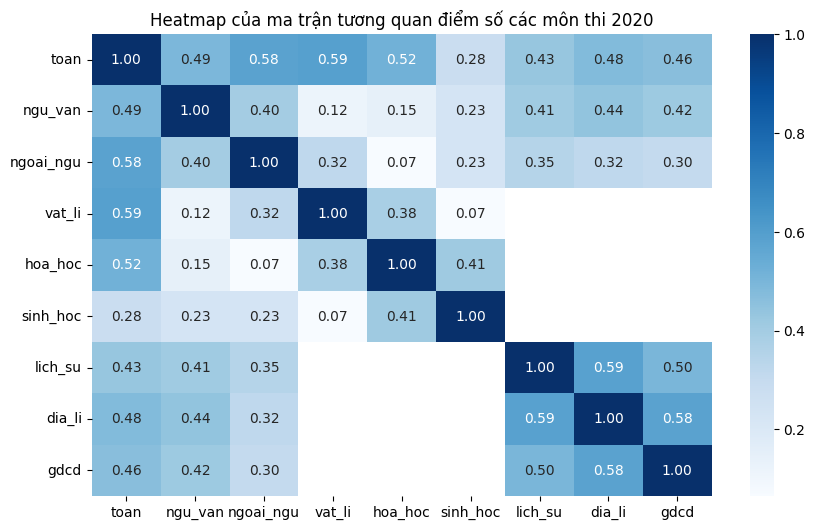

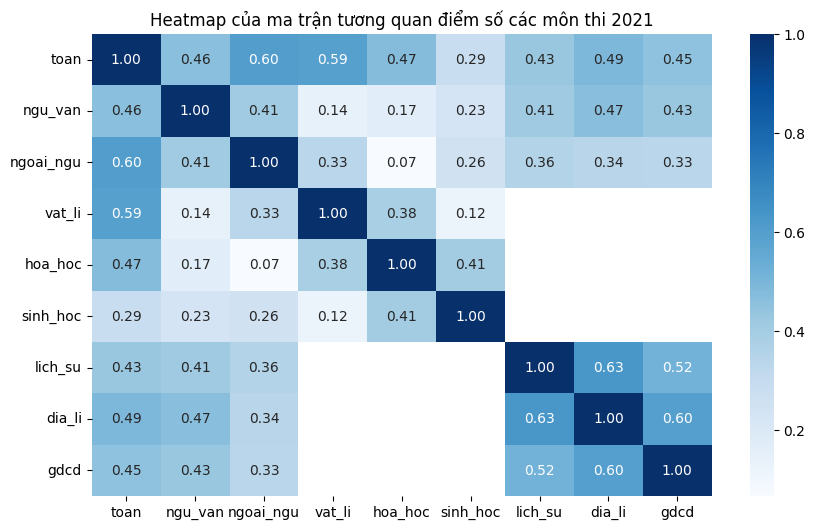

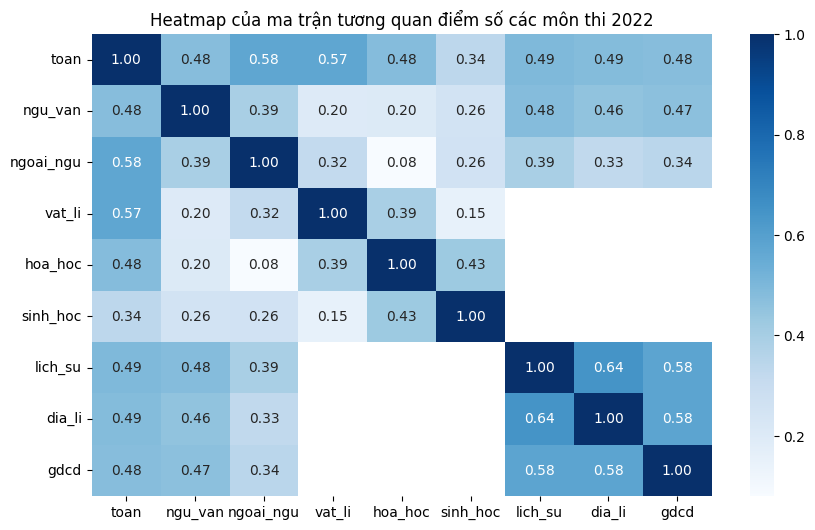

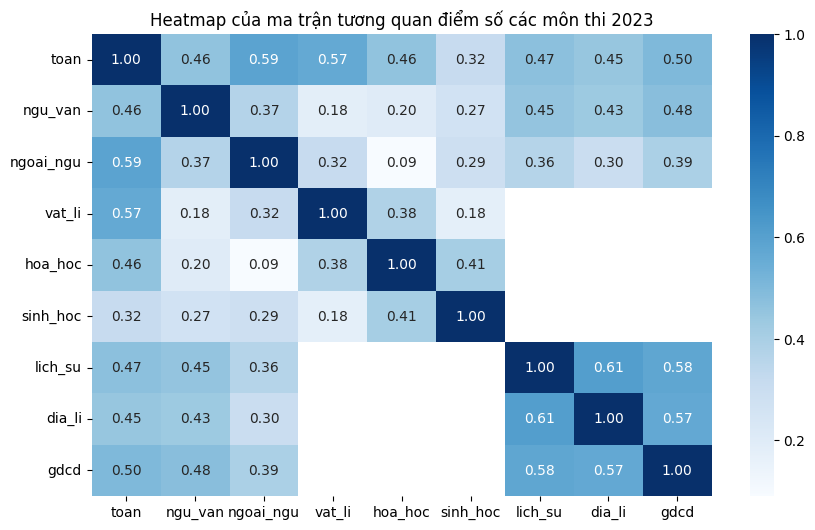

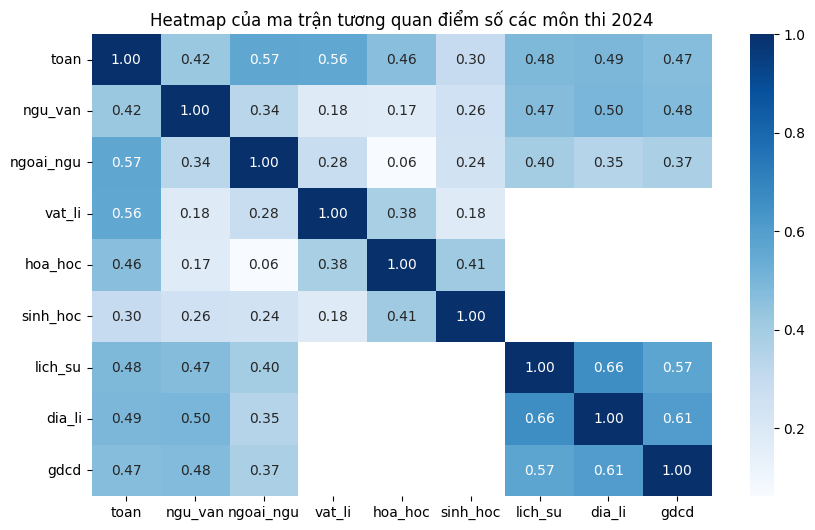

In [ ]:
years = [2020, 2021, 2022, 2023, 2024]

# Lặp qua từng năm để vẽ heatmap
for year in years:
    df_year = sampled_data[sampled_data['year'] == year]
    # Chọn các cột điểm
    subjects_scores = df_year[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]

    # corr() tính hệ số tương quan Pearson giữa các cặp môn học: Giá trị gần 1 → tương quan thuận (cùng tăng), Giá trị gần -1 → tương quan nghịch, Gần 0 → ít hoặc không liên quan
    # Tính toán ma trận tương quan
    corretation_matrix = subjects_scores.corr()

    # Vẽ biểu đồ heatmap của ma trận tương quan
    plt.figure(figsize=(10, 6))
    sns.heatmap(corretation_matrix, annot=True, cmap='Blues', fmt='.2f')
    plt.title(f'Heatmap của ma trận tương quan điểm số các môn thi {year}')
    plt.show()

2. Heatmap các tổ hợp môn theo từng năm

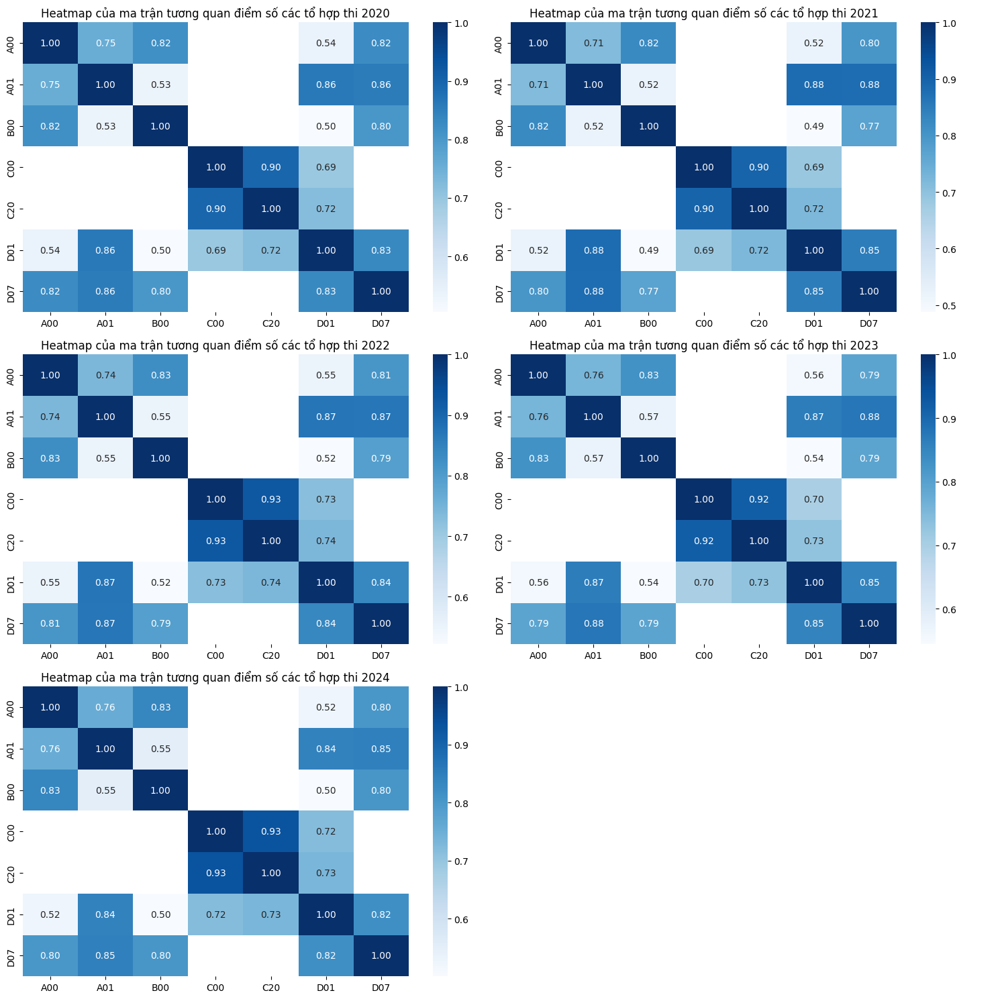

In [ ]:
# Tính tương quan giữa các tổ hợp điểm xét tuyển
# Tổ hợp nào có cấu trúc môn giống nhau sẽ tương quan cao ( có cùng nhiều môn thì tương quan sẽ cao)
sampled_data['A00'] = sampled_data['toan'] + sampled_data['vat_li'] + sampled_data['hoa_hoc']
sampled_data['A01'] = sampled_data['toan'] + sampled_data['vat_li'] + sampled_data['ngoai_ngu']
sampled_data['B00'] = sampled_data['toan'] + sampled_data['hoa_hoc'] + sampled_data['sinh_hoc']
sampled_data['C00'] = sampled_data['ngu_van'] + sampled_data['lich_su'] + sampled_data['dia_li']
sampled_data['C20'] = sampled_data['ngu_van'] + sampled_data['dia_li'] + sampled_data['gdcd']
sampled_data['D01'] = sampled_data['toan'] + sampled_data['ngoai_ngu'] + sampled_data['ngu_van']
sampled_data['D07'] = sampled_data['toan'] + sampled_data['ngoai_ngu'] + sampled_data['hoa_hoc']

years = [2020, 2021, 2022, 2023, 2024]

# Tạo subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 15))  # Thiết lập lưới 3x2 cho 6 biểu đồ
axes = axes.flatten()  # Biến đổi thành 1 danh sách để dễ dàng truy cập

# Lặp qua từng năm để vẽ heatmap
for i, year in enumerate(years):
    df_year = sampled_data[sampled_data['year'] == year]
    # Chọn các cột điểm
    subjects_scores = df_year[['A00', 'A01', 'B00', 'C00', 'C20', 'D01', 'D07']]

    # Tính toán ma trận tương quan
    corretation_matrix = subjects_scores.corr()

    # Vẽ biểu đồ heatmap của ma trận tương quan
    sns.heatmap(corretation_matrix, annot=True, cmap='Blues', fmt='.2f',  ax=axes[i])
    axes[i].set_title(f'Heatmap của ma trận tương quan điểm số các tổ hợp thi {year}')
# Ẩn biểu đồ trống
if len(years) < len(axes):
    for j in range(len(years), len(axes)):
        axes[j].axis('off')

plt.tight_layout()
plt.show()

Phân tích tốc độ tăng trưởng số lượng thí sinh theo từng vùng (region) qua các năm

In [40]:
df_province_region = pd.read_excel('province_region.xlsx')

In [41]:
print(df_province_region.head())

    province                         region
0   Hà Giang  Trung du và miền núi phía Bắc
1   Cao Bằng  Trung du và miền núi phía Bắc
2   Lạng Sơn  Trung du và miền núi phía Bắc
3  Bắc Giang  Trung du và miền núi phía Bắc
4    Phú Thọ  Trung du và miền núi phía Bắc


Gộp dữ liệu thí sinh với vùng

In [ ]:
# Nối bảng df_data_map (dữ liệu điểm thi) với bảng vùng theo province
# how='left' để giữ nguyên dữ liệu điểm thi và thêm thông tin vùng
df_data_map_region = (pd.merge(df_data_map,df_province_region, on='province', how='left'))

In [ ]:
df_data_map_region[df_data_map_region['code'] == '3'].head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,code,province,A00,A01,B00,C00,C20,D01,D07,region
195189,3000001,6.8,8.50,4.4,NaN,NaN,NaN,7.75,9.00,8.50,N1,2024,3,Hải Phòng,NaN,NaN,NaN,25.25,26.00,19.70,NaN,Đồng bằng sông Hồng
195190,3000002,6.6,9.25,8.4,NaN,NaN,NaN,7.75,7.50,9.25,N1,2024,3,Hải Phòng,NaN,NaN,NaN,24.50,26.00,24.25,NaN,Đồng bằng sông Hồng
195191,3000003,8.0,9.50,8.4,NaN,NaN,NaN,8.00,9.00,9.00,N1,2024,3,Hải Phòng,NaN,NaN,NaN,26.50,27.50,25.90,NaN,Đồng bằng sông Hồng
195192,3000004,8.4,8.75,5.4,8.25,7.0,7.5,NaN,NaN,NaN,N1,2024,3,Hải Phòng,23.65,22.05,22.9,NaN,NaN,22.55,20.8,Đồng bằng sông Hồng
195193,3000005,3.0,9.25,3.2,NaN,NaN,NaN,5.75,7.25,6.75,N1,2024,3,Hải Phòng,NaN,NaN,NaN,22.25,23.25,15.45,NaN,Đồng bằng sông Hồng


In [44]:
# Thống kê theo tỉnh
df_year_region = (df_data_map_region
                  .pivot_table(columns='year', index='region', aggfunc='count', values='sbd')
                  
                  .reset_index()
                  )

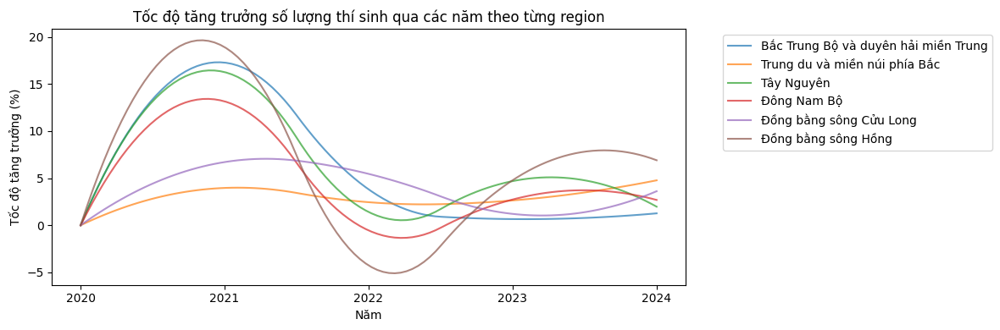

In [ ]:
# Tính toán số lượng thí sinh mỗi năm theo region
students_per_year_region = df_data_map_region.groupby(['year', 'region']).size().unstack()

# Tính toán tốc độ tăng trưởng: Tính phần trăm thay đổi so với năm trước
growth_rate_region = students_per_year_region.pct_change() * 100

# Xử lý các giá trị inf (chia cho 0) hoặc NaN (năm đầu tiên) → thành 0
growth_rate_region.replace([np.inf, -np.inf], np.nan, inplace=True)
growth_rate_region.fillna(0, inplace=True)

plt.figure(figsize=(12,4))

# Vẽ biểu đồ spline tăng trưởng
for region in growth_rate_region.columns:
    x = growth_rate_region.index
    y = growth_rate_region[region]

    # Tạo các điểm x mới để làm mịn đường
    x_new = np.linspace(x.min(), x.max(), 100)

    # Tạo spline để làm mịn đường
    # make_interp_spline giúp vẽ đường cong mượt thay vì đường gấp khúc
    # Mỗi vùng (region) sẽ có một đường thể hiện xu hướng tăng/giảm số lượng thí sinh theo thời gian
    spl = make_interp_spline(x, y, k=2)
    y_smooth = spl(x_new)

    plt.plot(x_new, y_smooth, label=region, linewidth=1.5, alpha=0.7)

plt.title('Tốc độ tăng trưởng số lượng thí sinh qua các năm theo từng region')
plt.xlabel('Năm')
plt.ylabel('Tốc độ tăng trưởng (%)')
plt.xticks(x_year) # plt.xticks(growth_rate_region.index)
plt.legend(loc='upper left', bbox_to_anchor=(1.05,1))
plt.grid(False)
plt.xticks(x_year)
plt.tight_layout()
plt.show()

In [46]:
growth_rate_region.head()

region,Bắc Trung Bộ và duyên hải miền Trung,Trung du và miền núi phía Bắc,Tây Nguyên,Đông Nam Bộ,Đồng bằng sông Cửu Long,Đồng bằng sông Hồng
year,,,,,,
2020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2021,17.269117,3.964982,16.259661,13.152590,6.710563,18.908817
2022,3.813669,2.451351,1.411933,-0.545555,5.456841,-4.259920
2023,0.658989,2.639351,4.689673,2.735943,1.210558,4.783579
2024,1.268569,4.773009,1.975023,2.690742,3.616066,6.903157


Vẽ biểu đồ cột số lượng thí sinh theo region

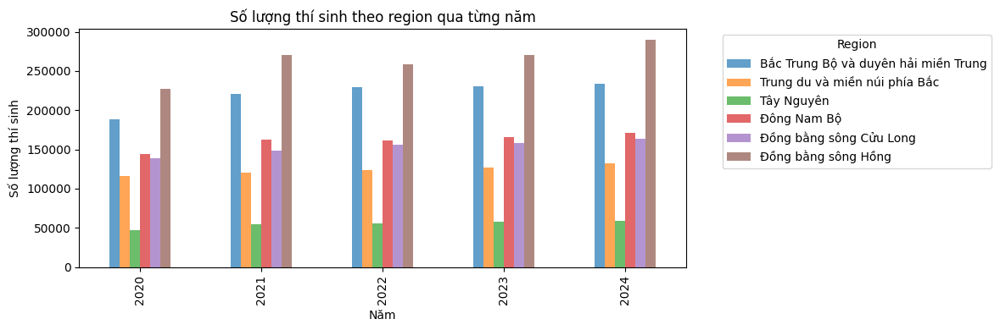

In [ ]:
# Đếm số lượng thí sinh theo từng vùng qua các năm
# Dùng biểu đồ cột nhóm để so sánh
students_per_year_region = df_data_map_region.groupby(['year', 'region']).size().unstack()
students_per_year_region.plot(kind='bar', figsize=(12,4), alpha=0.7)
plt.title('Số lượng thí sinh theo region qua từng năm')
plt.xlabel('Năm')
plt.ylabel('Số lượng thí sinh')
plt.legend(title='Region',loc='upper left', bbox_to_anchor=(1.05,1))
plt.tight_layout()
plt.show()

Tính tỉ lệ tăng giảm số lượng thí sinh theo tỉnh và vùng

In [ ]:
# Dữ liệu điểm thi được gom nhóm theo từng tỉnh và năm
# Sau đó tính tỉ lệ tăng trưởng năm sau so với năm trước
data_area = df_data_map_region.copy()

# Chuyển cột 'year' thành chuỗi
data_area['year'] = data_area['year'].astype(str)
# Danh sách các vùng kinh tế
regions = ['Trung du và miền núi phía Bắc','Tây Nguyên','Đông Nam Bộ','Đồng bằng sông Cửu Long','Đồng bằng sông Hồng', 'Bắc Trung Bộ và duyên hải miền Trung']

# Tạo dictionary để lưu trữ styled DataFrame cho mỗi vùng
df_year_group_area_styleds = {}

for region in regions:
    # Lọc dữ liệu theo vùng kinh tế
    df_year_group_area = (
        data_area[data_area['region'] == region]
        .pivot_table(index='province', columns='year', aggfunc='count', values='sbd')
        .reset_index()
    )
    
    # So sánh tỉ lệ tăng giảm số lượng
    df_year_group_area['diff_21'] = ((df_year_group_area['2021'] - df_year_group_area['2020']) / df_year_group_area['2020'])
    df_year_group_area['diff_22'] = ((df_year_group_area['2022'] - df_year_group_area['2021']) / df_year_group_area['2021'])
    df_year_group_area['diff_23'] = ((df_year_group_area['2023'] - df_year_group_area['2022']) / df_year_group_area['2022'])
    df_year_group_area['diff_24'] = ((df_year_group_area['2024'] - df_year_group_area['2023']) / df_year_group_area['2023'])
    
    # Sắp xếp DataFrame
    df_year_group_area_sorted = df_year_group_area.sort_values(by='2024', ascending=False)

    # Tô màu (heat map) cho table: Hiển thị các giá trị % và tô màu đậm nhạt giúp dễ phát hiện tỉnh tăng/giảm mạnh
    df_year_group_area_styled = (
        df_year_group_area_sorted
        .style.format({
            'diff_21': '{:.0%}',
            'diff_22': '{:.0%}',
            'diff_23': '{:.0%}',
            'diff_24': '{:.0%}'
        })
        .background_gradient(subset=['diff_21', 'diff_22', 'diff_23', 'diff_24'], cmap='PuBu')
    )

    # Lưu styled DataFrame vào dictionary
    df_year_group_area_styleds[region] = df_year_group_area_styled
    
# Hiển thị tất cả styled DataFrame theo vùng: tạo báo cáo động cho từng vùng (region), trình bày rất đẹp nếu chạy trong Jupyter Notebook
for region, styled_df in df_year_group_area_styleds.items():
    print(f"Styled DataFrame cho vùng: {region}")
    display(styled_df)


Styled DataFrame cho vùng: Trung du và miền núi phía Bắc


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
0,Bắc Giang,19298,17938,20553,21080,21755,-7%,15%,3%,3%
10,Thái Nguyên,15190,14845,15083,16153,16713,-2%,2%,7%,3%
8,Phú Thọ,13810,16165,15808,15874,16382,17%,-2%,0%,3%
9,Sơn La,11626,11384,11325,11773,12584,-2%,-1%,4%,7%
4,Hòa Bình,9151,9489,9575,9690,9823,4%,1%,1%,1%
7,Lạng Sơn,8510,9539,9608,9353,9469,12%,1%,-3%,1%
11,Tuyên Quang,7995,8688,8425,8392,8984,9%,-3%,-0%,7%
12,Yên Bái,7404,8088,8048,8235,8687,9%,-0%,2%,5%
6,Lào Cai,6355,7337,7204,7866,8356,15%,-2%,9%,6%
3,Hà Giang,5627,5618,5863,6286,6920,-0%,4%,7%,10%


Styled DataFrame cho vùng: Tây Nguyên


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
2,Đăk Lăk,13945,19785,20348,21042,20865,42%,3%,3%,-1%
1,Lâm Đồng,13497,14183,14102,14687,15372,5%,-1%,4%,5%
0,Gia Lai,13315,13953,14075,14861,15201,5%,1%,6%,2%
3,Đăk Nông,6212,6685,6852,7384,7681,8%,2%,8%,4%


Styled DataFrame cho vùng: Đông Nam Bộ


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
3,TP. Hồ Chí Minh,74451,86367,84596,84851,87322,16%,-2%,0%,3%
5,Đồng Nai,28254,30390,31363,33158,33800,8%,3%,6%,2%
1,Bình Dương,11386,13015,12797,14218,15239,14%,-2%,11%,7%
0,Bà Rịa -Vũng Tàu,11441,12970,12661,12925,12635,13%,-2%,2%,-2%
2,Bình Phước,9774,10372,10702,10930,11304,6%,3%,2%,3%
4,Tây Ninh,8544,9656,9763,10229,10486,13%,1%,5%,3%


Styled DataFrame cho vùng: Đồng bằng sông Cửu Long


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
0,An Giang,15239,12120,18574,19942,20251,-20%,53%,7%,2%
12,Đồng Tháp,13386,10531,15038,15678,16464,-21%,43%,4%,5%
9,Tiền Giang,14283,16198,15028,15455,16273,13%,-7%,3%,5%
7,Long An,13850,16375,15321,15653,15771,18%,-6%,2%,1%
6,Kiên Giang,12434,13711,14325,14423,15035,10%,4%,1%,4%
4,Cần Thơ,10648,12120,12195,12061,12841,14%,1%,-1%,6%
2,Bến Tre,11313,13200,12301,12117,12145,17%,-7%,-1%,0%
11,Vĩnh Long,10215,11343,10327,10435,10913,11%,-9%,1%,5%
8,Sóc Trăng,8514,9632,9985,10045,10642,13%,4%,1%,6%
3,Cà Mau,9637,10925,10692,9776,10151,13%,-2%,-9%,4%


Styled DataFrame cho vùng: Đồng bằng sông Hồng


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
2,Hà Nội,78860,100838,96942,102095,107867,28%,-4%,5%,6%
5,Hải Phòng,18533,23269,22399,22723,25530,26%,-4%,1%,12%
4,Hải Dương,19583,22293,20422,21934,23366,14%,-8%,7%,7%
9,Thái Bình,19592,22880,20145,20845,22580,17%,-12%,3%,8%
6,Nam Định,18667,20953,19769,20405,21760,12%,-6%,3%,7%
8,Quảng Ninh,14547,16393,15624,16025,17848,13%,-5%,3%,11%
0,Bắc Ninh,14621,16355,15850,16724,17614,12%,-3%,6%,5%
3,Hưng Yên,12780,12357,13885,15386,16329,-3%,12%,11%,6%
10,Vĩnh Phúc,12171,14023,13873,14042,15461,15%,-1%,1%,10%
7,Ninh Bình,9219,11063,10501,11149,11749,20%,-5%,6%,5%


Styled DataFrame cho vùng: Bắc Trung Bộ và duyên hải miền Trung


year,province,2020,2021,2022,2023,2024,diff_21,diff_22,diff_23,diff_24
11,Thanh Hóa,34740.000000,40085.000000,37466.000000,36480.000000,38532.000000,15%,-7%,-3%,6%
4,Nghệ An,31072.000000,34327.000000,36564.000000,36886.000000,36729.000000,10%,7%,1%,-0%
1,Bình Định,16876.000000,15428.000000,18489.000000,18897.000000,19342.000000,-9%,20%,2%,2%
8,Quảng Nam,7280.000000,16727.000000,16739.000000,17197.000000,17292.000000,130%,0%,3%,1%
2,Hà Tĩnh,15308.000000,17285.000000,17304.000000,17249.000000,17004.000000,13%,0%,-0%,-1%
3,Khánh Hòa,13094.000000,13858.000000,14025.000000,14487.000000,14388.000000,6%,1%,3%,-1%
9,Quảng Ngãi,11966.000000,9002.000000,13295.000000,13870.000000,14354.000000,-25%,48%,4%,3%
13,Đà Nẵng,nan,12637.000000,12575.000000,13133.000000,13414.000000,nan%,-0%,4%,2%
0,Bình Thuận,10893.000000,12043.000000,12727.000000,12900.000000,13133.000000,11%,6%,1%,2%
12,Thừa Thiên Huế,12514.000000,13311.000000,13296.000000,13029.000000,12774.000000,6%,-0%,-2%,-2%


Tính thống kê điểm theo từng môn – từng tỉnh – từng năm

In [ ]:
# Với mỗi năm – tỉnh – môn học, tính: median: điểm trung vị, top_count: số thí sinh nằm trong top 5%, std_dev: độ lệch chuẩn → dùng để đo mức độ phân tán
df_score_province = df_data_map_region.copy()
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

summary_results = {}

# Lặp qua từng năm
for year, group_year in df_score_province.groupby('year'):  
    for province, group in group_year.groupby('province'):
        if province not in summary_results:
            summary_results[province] = {}
        
        summary_results[province][year] = {}  # Khởi tạo từ điển cho mỗi năm
        
        for subject in subjects:
            median = group[subject].median()
            threshold = group[subject].quantile(0.95)
            top_count = (group[subject] >= threshold).sum()
            std_dev = group[subject].std()
            
            summary_results[province][year][subject] = {
                'median': median,
                'top_count': top_count,
                'std_dev': std_dev
            }

# Chuyển kết quả thành DataFrame
rows = []
for province, years in summary_results.items():
    for year, subjects in years.items():
        for subject, values in subjects.items():
            rows.append({
                'province': province,
                'year': year,
                'subject': subject,
                'median': values['median'],
                'top_count': values['top_count'],
                'std_dev': values['std_dev']
            })

# Gộp thành DataFrame để phân tích thêm
summary_df = pd.DataFrame(rows)
print(summary_df.head(30))

    province  year    subject  median  top_count   std_dev
0   An Giang  2020       toan    7.20       1197  1.451342
1   An Giang  2020    ngu_van    7.75       1471  1.043052
2   An Giang  2020  ngoai_ngu    4.80        856  1.466709
3   An Giang  2020     vat_li    7.00        317  1.309348
4   An Giang  2020    hoa_hoc    7.00        492  1.395357
5   An Giang  2020   sinh_hoc    6.00        398  1.204488
6   An Giang  2020    lich_su    5.50        470  1.621458
7   An Giang  2020     dia_li    7.25        455  1.004992
8   An Giang  2020       gdcd    8.75        629  0.885114
9   An Giang  2021       toan    7.00        875  1.313535
10  An Giang  2021    ngu_van    7.25        820  1.149935
11  An Giang  2021  ngoai_ngu    6.20        694  1.801204
12  An Giang  2021     vat_li    6.75        386  1.195280
13  An Giang  2021    hoa_hoc    7.00        360  1.355647
14  An Giang  2021   sinh_hoc    6.25        244  1.359070
15  An Giang  2021    lich_su    5.75        509  1.7426

In [50]:
# import pandas as pd

# df_score_province = df_data_map_region.copy()
# subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

# summary_results = {}

# # Lặp qua từng năm
# for year, group_year in df_score_province.groupby('year'):  
#     for province, group in group_year.groupby('province'):
#         if province == 'TP. Hồ Chí Minh':
#             if province not in summary_results:
#                 summary_results[province] = {}
            
#             summary_results[province][year] = {}  # Khởi tạo từ điển cho mỗi năm
            
#             for subject in ['toan', 'vat_li', 'hoa_hoc', 'ngoai_ngu']:
#                 median = group[subject].median()
#                 threshold = group[subject].quantile(0.95)
#                 top_count = (group[subject] >= threshold).sum()
#                 std_dev = group[subject].std()
                
#                 summary_results[province][year][subject] = {
#                     'median': median,
#                     'top_count': top_count,
#                     'std_dev': std_dev
#                 }

# # Chuyển kết quả thành DataFrame
# rows = []
# for province, years in summary_results.items():
#     for year, subjects in years.items():
#         row = {'year': year}
#         for subject in ['toan', 'vat_li', 'hoa_hoc', 'ngoai_ngu']:
#             if subject in subjects:
#                 row[subject + '_median'] = subjects[subject]['median']
#                 row[subject + '_top_count'] = subjects[subject]['top_count']
#                 row[subject + '_std_dev'] = subjects[subject]['std_dev']
#             else:
#                 row[subject + '_median'] = None
#                 row[subject + '_top_count'] = None
#                 row[subject + '_std_dev'] = None
#         rows.append(row)

# summary_df = pd.DataFrame(rows)

# print(summary_df)

Phân tích tỉnh nào nổi bật nhất theo từng môn học, từng năm theo 3 tiêu chí: Top 5% thí sinh cao điểm nhiều nhất (top_count), Điểm trung vị cao nhất (median), Độ lệch chuẩn lớn nhất (std_dev – thể hiện sự phân tán điểm)

In [51]:
# Khởi tạo từ điển để lưu trữ kết quả top
top_results_year = {}

for subject in subjects:
    top_results_year[subject] = {}  # Khởi tạo từ điển cho mỗi môn
    for year in summary_df['year'].unique():
        year_data = summary_df[summary_df['year'] == year]
        
        # Lọc dữ liệu theo môn học
        subject_data = year_data[year_data['subject'] == subject]

        # Lấy Top 10 tỉnh theo các chỉ số
        top_5_provinces = subject_data.nlargest(15, 'top_count')[['province', 'top_count']]
        top_median_provinces = subject_data.nlargest(15, 'median')[['province', 'median']]
        top_std_dev_provinces = subject_data.nlargest(15, 'std_dev')[['province', 'std_dev']]

        # Lưu kết quả vào từ điển
        top_results_year[subject][year] = {
            'top_5_provinces': top_5_provinces.to_dict(orient='records'),
            'top_median_provinces': top_median_provinces.to_dict(orient='records'),
            'top_std_dev_provinces': top_std_dev_provinces.to_dict(orient='records'),
        }

# In kết quả cuối cùng
for subject in subjects:
    for year in top_results_year[subject]:
        print(f"\nMôn: {subject}, Năm: {year}")
        
        print("Top 15 tỉnh có nhiều thí sinh thuộc top 5%:")
        for province in top_results_year[subject][year]['top_5_provinces']:
            print(f"{province['province']}: {province['top_count']} thí sinh")
        
        print("Top 15 tỉnh có median cao nhất:")
        for province in top_results_year[subject][year]['top_median_provinces']:
            print(f"{province['province']}: {province['median']}")

        print("Top 15 tỉnh có độ lệch chuẩn cao nhất:")
        for province in top_results_year[subject][year]['top_std_dev_provinces']:
            print(f"{province['province']}: {province['std_dev']}")


Môn: toan, Năm: 2020
Top 15 tỉnh có nhiều thí sinh thuộc top 5%:
TP. Hồ Chí Minh: 6395 thí sinh
Hà Nội: 5991 thí sinh
Đồng Nai: 2172 thí sinh
Thanh Hóa: 1833 thí sinh
Nghệ An: 1626 thí sinh
Thái Bình: 1589 thí sinh
Bắc Giang: 1548 thí sinh
Hải Phòng: 1249 thí sinh
Bình Định: 1217 thí sinh
An Giang: 1197 thí sinh
Hải Dương: 1165 thí sinh
Lâm Đồng: 1089 thí sinh
Bắc Ninh: 1064 thí sinh
Đồng Tháp: 1022 thí sinh
Phú Thọ: 1005 thí sinh
Top 15 tỉnh có median cao nhất:
Nam Định: 8.0
Bình Dương: 7.6
Hà Nam: 7.6
Hà Nội: 7.6
Hải Phòng: 7.6
Ninh Bình: 7.6
TP. Hồ Chí Minh: 7.6
Thái Bình: 7.6
Bà Rịa -Vũng Tàu: 7.4
Bắc Ninh: 7.4
Hải Dương: 7.4
Tiền Giang: 7.4
An Giang: 7.2
Bình Phước: 7.2
Bình Định: 7.2
Top 15 tỉnh có độ lệch chuẩn cao nhất:
Thanh Hóa: 2.110038874215188
Quảng Ninh: 2.0291912946260453
Hòa Bình: 2.015064554270544
Hà Giang: 1.9634245234452627
Thái Nguyên: 1.9614979727345923
Cao Bằng: 1.9563454923032992
Quảng Ngãi: 1.953058976804662
Quảng Nam: 1.9357919543444049
Đăk Lăk: 1.934448828718

Làm sạch dữ liệu

In [ ]:
# Đọc file JSON bản đồ
import json
file_path = 'ban_do_Viet_Nam.json'
# Biến data là một dictionary chứa toàn bộ nội dung file
with open(file_path, 'r', encoding='utf-8') as file:
    data = json.load(file)

# Inspect the data structure
print(data)

{'type': 'FeatureCollection', 'name': 'gadm41_VNM_1', 'crs': {'type': 'name', 'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}}, 'features': [{'type': 'Feature', 'properties': {'GID_1': 'VNM.1_1', 'GID_0': 'VNM', 'COUNTRY': 'Vietnam', 'NAME_1': 'An Giang', 'VARNAME_1': 'AnGiang', 'NL_NAME_1': 'NA', 'TYPE_1': 'Tỉnh', 'ENGTYPE_1': 'Province', 'CC_1': 'NA', 'HASC_1': 'VN.AG', 'ISO_1': 'VN-44'}, 'geometry': {'type': 'MultiPolygon', 'coordinates': [[[[105.5486, 10.4295], [105.5495, 10.4252], [105.5465, 10.4205], [105.5523, 10.4188], [105.5522, 10.4165], [105.5453, 10.4129], [105.5396, 10.4132], [105.5366, 10.4098], [105.5318, 10.4082], [105.5297, 10.4004], [105.5238, 10.4001], [105.529, 10.3771], [105.5279, 10.3744], [105.5206, 10.3695], [105.521, 10.3634], [105.5142, 10.3619], [105.5084, 10.3561], [105.5011, 10.3549], [105.4976, 10.3501], [105.4911, 10.3455], [105.4915, 10.3384], [105.4877, 10.3346], [105.4954, 10.3253], [105.4873, 10.3239], [105.4846, 10.3164], [105.4771, 10.3106],

In [53]:
import json
import re

file_path = 'ban_do_Viet_Nam.json'
with open(file_path, 'r', encoding='utf-8') as file:
    data = json.load(file)

map_vietnam = pd.json_normalize(data['features'])

# Hàm để chuẩn hóa tên tỉnh
def normalize_province_name(name):
    # Xóa thừa khoảng trắng
    name = name.strip()  # Xóa khoảng trắng đầu và cuối
    name = re.sub(r'\s+', '', name)  # Thay thế nhiều khoảng trắng bằng 1 khoảng trắng
    return name

# Hàm để thêm khoảng trắng
def add_space_to_province_name(name):
    # Thêm khoảng trắng trước mỗi chữ cái viết hoa (trừ chữ đầu tiên)
    if ' ' not in name:
        name = name.replace("Đắk", "Đăk").replace("Lắk", "Lăk")
        name = re.sub(r'(?<!^)(?=[A-ZĐ])', ' ', name)
        # Đặc biệt xử lý tên tỉnh "Bà Rịa -Vũng Tàu"
        name = name.replace("- ", " -").replace("Hồ Chí Minh", "TP. Hồ Chí Minh")
    return name

# Sửa đổi tên tỉnh
for feature in data['features']:
    original_name = feature['properties']['NAME_1']
    feature['properties']['NAME_1'] = add_space_to_province_name(original_name)

# Lưu lại file JSON sau khi sửa đổi
with open(file_path, 'w', encoding='utf-8') as file:
    json.dump(data, file, ensure_ascii=False, indent=4)

print("Đã thêm khoảng trắng thành công vào tên các tỉnh trong file JSON.")
# In ra tên các tỉnh
for feature in data['features']:
    province_name = feature['properties']['NAME_1']
    print(province_name)


Đã thêm khoảng trắng thành công vào tên các tỉnh trong file JSON.
An Giang
Bà Rịa -Vũng Tàu
Bắc Giang
Bắc Kạn
Bạc Liêu
Bắc Ninh
Bến Tre
Bình Định
Bình Dương
Bình Phước
Bình Thuận
Cà Mau
Cần Thơ
Cao Bằng
Đà Nẵng
Đăk Lăk
Đăk Nông
Điện Biên
Đồng Nai
Đồng Tháp
Gia Lai
Hà Giang
Hà Nam
Hà Nội
Hà Tĩnh
Hải Dương
Hải Phòng
Hậu Giang
TP. Hồ Chí Minh
Hoà Bình
Hưng Yên
Khánh Hòa
Kiên Giang
Kon Tum
Lai Châu
Lâm Đồng
Lạng Sơn
Lào Cai
Long An
Nam Định
Nghệ An
Ninh Bình
Ninh Thuận
Phú Thọ
Phú Yên
Quảng Bình
Quảng Nam
Quảng Ngãi
Quảng Ninh
Quảng Trị
Sóc Trăng
Sơn La
Tây Ninh
Thái Bình
Thái Nguyên
Thanh Hóa
Thừa Thiên Huế
Tiền Giang
Trà Vinh
Tuyên Quang
Vĩnh Long
Vĩnh Phúc
Yên Bái


Tạo ra bản đồ nhiệt (choropleth maps) thể hiện mức độ điểm số trung bình (median) của học sinh từng tỉnh, từng năm cho mỗi môn học\ Những tỉnh có median cao nhất sẽ được tô đậm hơn, giúp người xem nhận ra tỉnh nào học tốt môn nào

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

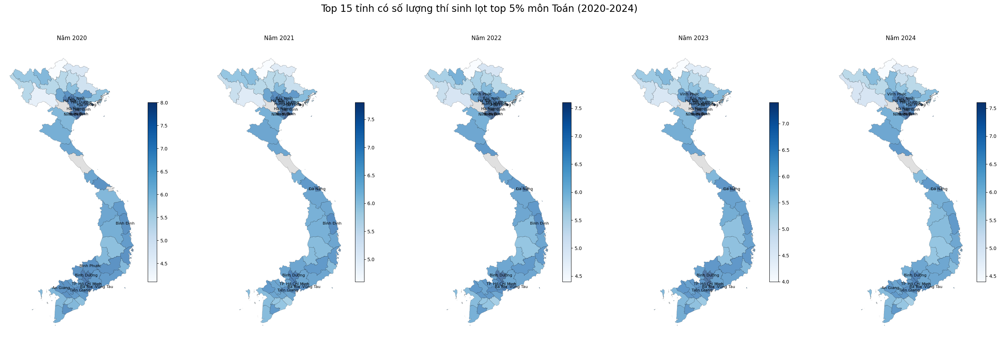

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

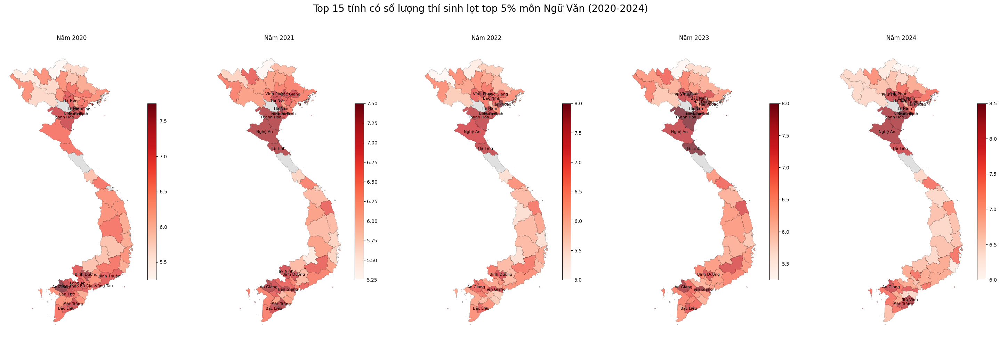

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

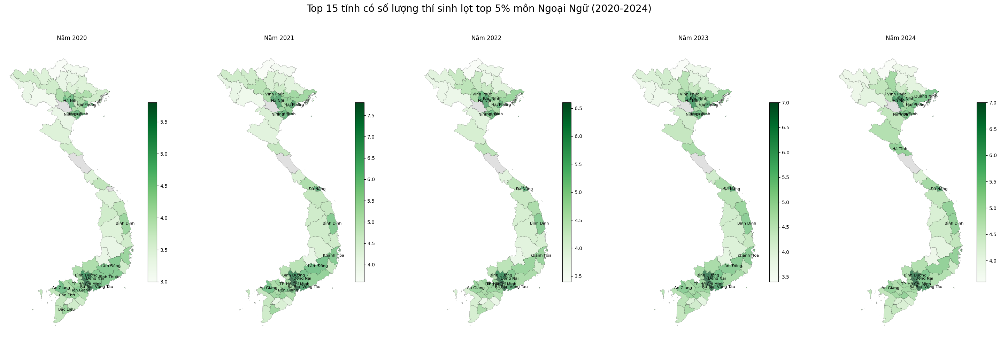

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

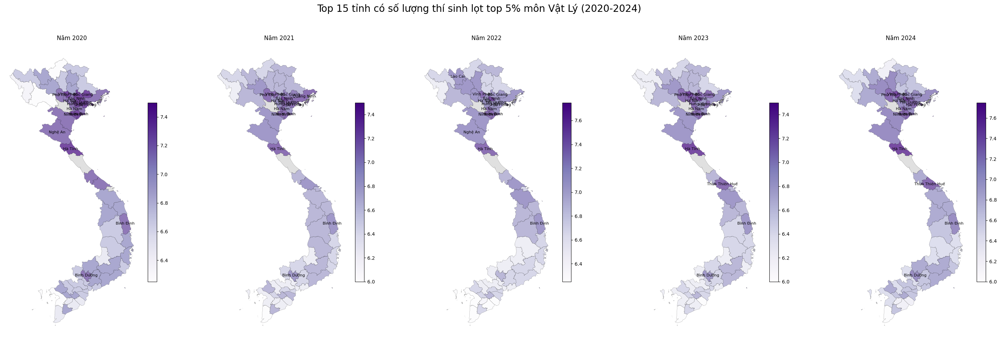

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

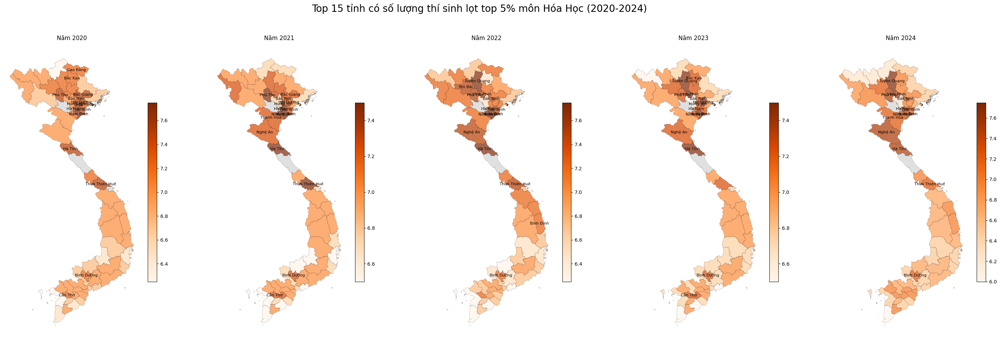

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

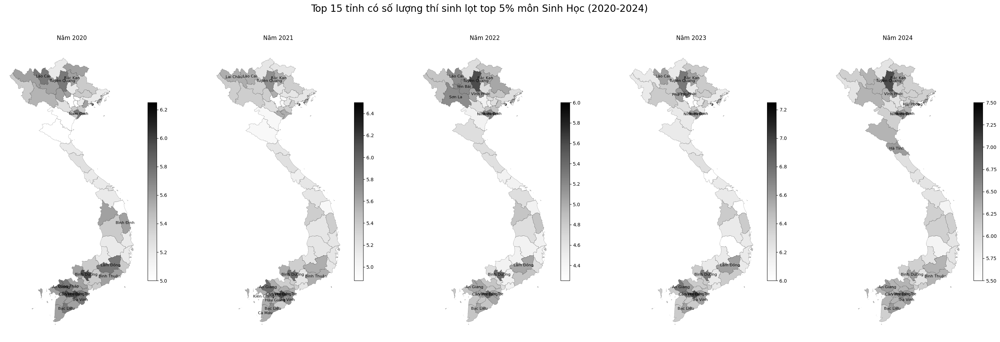

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

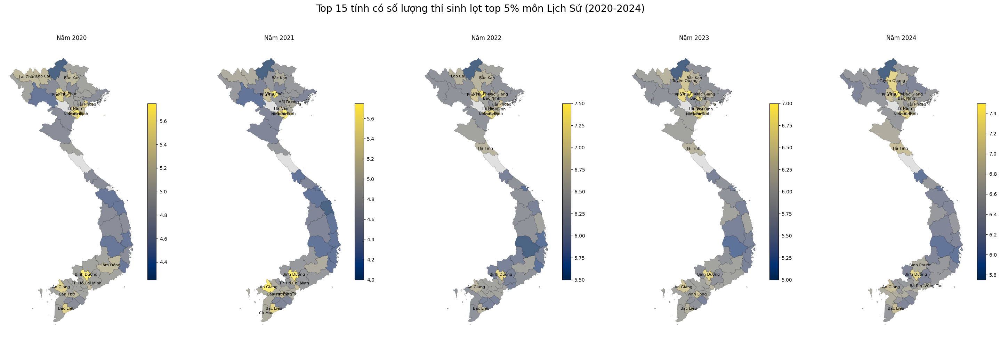

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

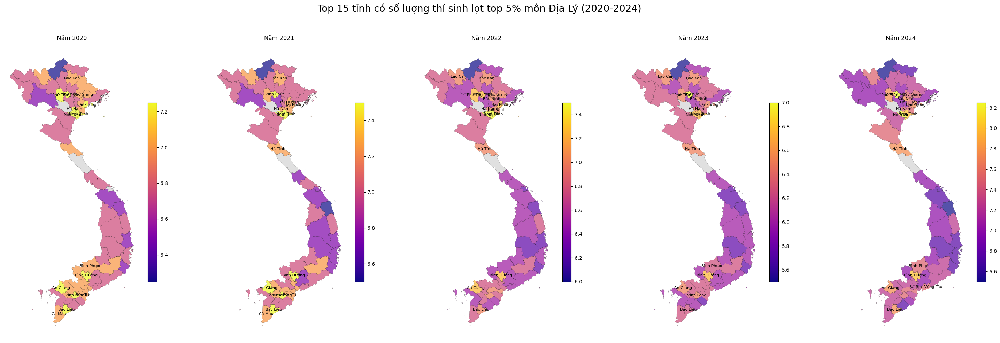

C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
C:\Users\asout\AppData\Local\Temp\ipykernel_2780\3119295387.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(merged.geometry.centroid.x,

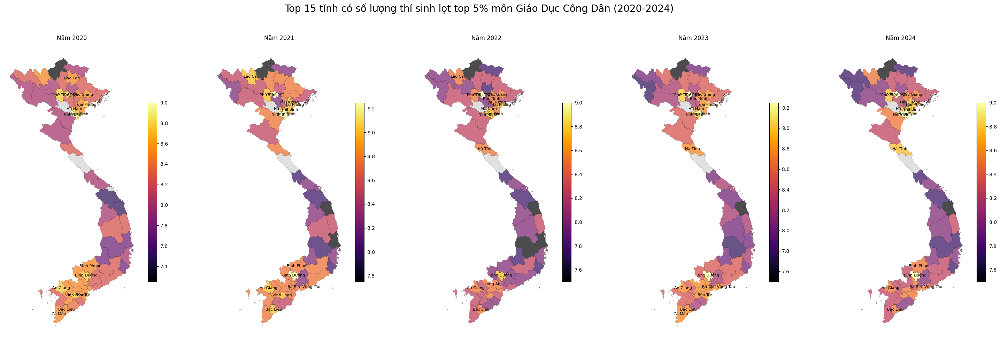

In [ ]:
# Import và đọc dữ liệu bản đồ: Đọc file GeoJSON (ban_do_Viet_Nam.json) dưới dạng GeoDataFrame (vn_map), trong đó mỗi hàng là 1 tỉnh với hình học (geometry) và thuộc tính (NAME_1)
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd

# Đọc dữ liệu hình học của Việt Nam
vn_map = gpd.read_file('ban_do_Viet_Nam.json')
vn_map = vn_map.to_crs(epsg=3857)  # Chuyển sang hệ tọa độ phẳng để tính toán centroid chính xác

# Tạo từ điển màu cho từng môn học
cmap_dict = {
    'toan': 'Blues',       # Màu cho môn Toán
    'ngu_van': 'Reds',     # Màu cho môn Ngữ Văn
    'ngoai_ngu': 'Greens', # Màu cho môn Ngoại Ngữ
    'vat_li': 'Purples',   # Màu cho môn Vật Lý
    'hoa_hoc': 'Oranges',  # Màu cho môn Hóa Học
    'sinh_hoc': 'Greys',   # Màu cho môn Sinh Học
    'lich_su': 'cividis',  # Màu cho môn Lịch Sử
    'dia_li': 'plasma',    # Màu cho môn Địa Lý
    'gdcd': 'inferno'      # Màu cho môn GDCD
}

# Đặt tên đầy đủ cho các môn học
full_subject_names = {
    'toan': 'Toán',
    'ngu_van': 'Ngữ Văn',
    'ngoai_ngu': 'Ngoại Ngữ',
    'vat_li': 'Vật Lý',
    'hoa_hoc': 'Hóa Học',
    'sinh_hoc': 'Sinh Học',
    'lich_su': 'Lịch Sử',
    'dia_li': 'Địa Lý',
    'gdcd': 'Giáo Dục Công Dân'
}

subjects = cmap_dict.keys()
years = [2020, 2021, 2022, 2023, 2024]

# Vẽ bản đồ cho từng môn học: Với mỗi môn học, vẽ 5 bản đồ con (subplot), mỗi bản đồ cho một năm
for subject in subjects:
    fig, axes = plt.subplots(1, len(years), figsize=(30, 10))  # Kích thước cho mỗi hình ảnh

    for col_idx, year in enumerate(years):
        ax = axes[col_idx]

        # Lấy dữ liệu median cho môn và năm: Lấy dữ liệu median để tô màu bản đồ
        # summary_df là bảng tổng hợp thông tin: tỉnh, năm, môn học, điểm trung vị median
        data_for_map = summary_df[(summary_df['subject'] == subject) & (summary_df['year'] == year)]
        
        # Merge với bản đồ Việt Nam
        # join() dùng để gắn dữ liệu điểm thi vào bản đồ theo tỉnh (province khớp NAME_1)
        merged = vn_map.set_index('NAME_1').join(data_for_map.set_index('province'))

        # Chuẩn bị gradient màu
        norm = mpl.colors.Normalize(vmin=merged['median'].min(), vmax=merged['median'].max())
        cmap = plt.get_cmap(cmap_dict[subject])

        # Vẽ bản đồ với màu phân bổ theo median
        # Dùng cột median làm thước đo để tô màu
        # Các tỉnh có điểm median cao sẽ có màu đậm hơn
        merged.plot(column='median', ax=ax, cmap=cmap, norm=norm, edgecolor='black', linewidth=0.2, alpha=0.7,
                    missing_kwds={'color': 'lightgrey', 'label': 'Missing values'})

        # Lấy 20 tỉnh hàng đầu theo median
        top_provinces = data_for_map.nlargest(15, 'median')['province'].tolist()

        # Thêm tên tỉnh, chỉ hiển thị cho 20 tỉnh hàng đầu
        for x, y, label in zip(merged.geometry.centroid.x, merged.geometry.centroid.y, merged.index):
            if label in top_provinces:
                ax.text(x, y, label, fontsize=8, ha='center', va='center')

        # Tiêu đề cho subplot
        ax.set_title(f'Năm {year}', fontsize=12, pad=10)
        ax.axis('off')  # Tắt trục

        # Thêm thang màu
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    # Tiêu đề chung cho tất cả các bản đồ
    plt.suptitle(f'Top 15 tỉnh có số lượng thí sinh lọt top 5% môn {full_subject_names[subject]} (2020-2024)', fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Điều chỉnh lề

    plt.show()

In [55]:
df_data_map.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,code,province,A00,A01,B00,C00,C20,D01,D07
0,1000001,8.4,6.75,8.0,6.0,5.25,5.0,NaN,NaN,NaN,N1,2024,1,Hà Nội,19.65,22.4,18.65,NaN,NaN,23.15,21.65
1,1000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1,2024,1,Hà Nội,NaN,NaN,NaN,21.75,22.50,24.30,NaN
2,1000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1,2024,1,Hà Nội,NaN,NaN,NaN,23.25,24.75,25.15,NaN
3,1000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1,2024,1,Hà Nội,NaN,NaN,NaN,21.50,22.00,20.70,NaN
4,1000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1,2024,1,Hà Nội,NaN,NaN,NaN,26.75,26.25,25.40,NaN


In [56]:
summary_df.head()

,province,year,subject,median,top_count,std_dev
0,An Giang,2020,toan,7.20,1197,1.451342
1,An Giang,2020,ngu_van,7.75,1471,1.043052
2,An Giang,2020,ngoai_ngu,4.80,856,1.466709
3,An Giang,2020,vat_li,7.00,317,1.309348
4,An Giang,2020,hoa_hoc,7.00,492,1.395357


Chuyển từ dictionary thống kê thành DataFrame

In [ ]:
# data_dict: là biến chứa các thông tin thống kê cho từng tổ hợp
# years: danh sách năm
# subject: nếu được chỉ định, sẽ chỉ lấy tổ hợp cụ thể
def dict_to_df(data_dict, years, subject=''):
    df = pd.DataFrame({'year': years})
    
    if subject:
        data_dict = {subject: data_dict[subject]}
    
    for key, stats in data_dict.items():
        df[f"{key}_mean"] = stats['mean']
        df[f"{key}_median"] = stats['median']
        df[f"{key}_p95"] = stats['p95']
    
    return df

Tạo DataFrame từ statistical_info cho từng tổ hợp

In [ ]:
# Sử dụng hàm dict_to_df: Biến statistical_info có thể có dạng (Mỗi tổ hợp tạo ra DataFrame riêng để phân tích)
stat_df_a00 = dict_to_df(statistical_info, recent_years_sorted, 'A00')
print(stat_df_a00)
stat_df_a01 = dict_to_df(statistical_info, recent_years_sorted, 'A01')
print(stat_df_a01)
stat_df_d01 = dict_to_df(statistical_info, recent_years_sorted, 'D01')
print(stat_df_d01)
stat_df_d07 = dict_to_df(statistical_info, recent_years_sorted, 'D07')
print(stat_df_d07)

   year   A00_mean  A00_median  A00_p95
0  2020  21.447058       21.90    26.05
1  2021  21.002582       21.40    25.45
2  2022  21.095522       21.45    25.75
3  2023  20.774499       21.15    25.20
4  2024  20.904633       21.30    25.75
   year   A01_mean  A01_median  A01_p95
0  2020  20.045048       20.20    25.30
1  2021  21.066548       21.35    26.15
2  2022  20.290873       20.40    25.55
3  2023  20.275288       20.45    25.40
4  2024  20.473793       20.75    25.50
   year   D01_mean  D01_median  D01_p95
0  2020  18.155880       18.25    24.35
1  2021  19.261637       19.40    25.50
2  2022  18.438079       18.55    24.65
3  2023  18.903006       19.05    24.90
4  2024  19.509257       19.65    25.20
   year   D07_mean  D07_median  D07_p95
0  2020  20.015915       20.25    24.80
1  2021  21.106911       21.45    25.85
2  2022  20.239675       20.50    25.10
3  2023  20.423293       20.65    25.05
4  2024  20.453492       20.70    25.20


Gộp tất cả tổ hợp vào một bảng thống kê duy nhất

In [ ]:
# Chuyển đổi dictionary thành DataFrame
# bảng có cột năm và thống kê các tổ hợp A00, A01, D01, D07
stat_df = pd.DataFrame({
    'year': recent_years_sorted
})

for subject, stats in statistical_info.items():
    stat_df[f"{subject}_mean"] = stats['mean']
    stat_df[f"{subject}_median"] = stats['median'] 
    stat_df[f"{subject}_p95"] = stats['p95']

# Hiển thị DataFrame
print(stat_df)

   year   A00_mean  A00_median  A00_p95   A01_mean  A01_median  A01_p95  \
0  2020  21.447058       21.90    26.05  20.045048       20.20    25.30   
1  2021  21.002582       21.40    25.45  21.066548       21.35    26.15   
2  2022  21.095522       21.45    25.75  20.290873       20.40    25.55   
3  2023  20.774499       21.15    25.20  20.275288       20.45    25.40   
4  2024  20.904633       21.30    25.75  20.473793       20.75    25.50   

    D01_mean  D01_median  D01_p95   D07_mean  D07_median  D07_p95  
0  18.155880       18.25    24.35  20.015915       20.25    24.80  
1  19.261637       19.40    25.50  21.106911       21.45    25.85  
2  18.438079       18.55    24.65  20.239675       20.50    25.10  
3  18.903006       19.05    24.90  20.423293       20.65    25.05  
4  19.509257       19.65    25.20  20.453492       20.70    25.20  


Chuyển đổi số lượng thí sinh theo từng tổ hợp

In [ ]:
# Chuyển đổi dictionary thành dataframe
# total_students_per_subject là dict có dạng
# Các cột được đổi tên thành A00_Total_Student
total_students_df = pd.DataFrame(total_students_per_subject)
# Đổi tên các cột
total_students_df = total_students_df.rename(columns={
    'A00': 'A00_Total_Student',
    'A01': 'A01_Total_Student', 
    'D01': 'D01_Total_Student',
    'D07': 'D07_Total_Student'
})
# Thêm cột 'năm'
total_students_df['year'] = recent_years_sorted

# Sắp xếp dataframe theo cột 'năm'
total_students_df = total_students_df.sort_values('year', ascending=True)

# Đưa cột 'năm' lên vị trí đầu tiên
total_students_df = total_students_df[['year', 'A00_Total_Student', 'A01_Total_Student', 'D01_Total_Student', 'D07_Total_Student']]

# Hiển thị dataframe
print(total_students_df)

   year  A00_Total_Student  A01_Total_Student  D01_Total_Student  \
0  2020             291252             283649             768235   
1  2021             343370             332412             864694   
2  2022             323673             312164             866730   
3  2023             325902             315146             878007   
4  2024             343800             329761             908866   

   D07_Total_Student  
0             282015  
1             331086  
2             310920  
3             314274  
4             328435  


Tách DataFrame theo tổ hợp

In [61]:
a00_total_df = total_students_df[['year', 'A00_Total_Student']]
print(a00_total_df)
a01_total_df = total_students_df[['year', 'A01_Total_Student']]
print(a01_total_df)
d01_total_df = total_students_df[['year', 'D01_Total_Student']]
print(d01_total_df)
d07_total_df = total_students_df[['year', 'D07_Total_Student']]
print(d07_total_df)

   year  A00_Total_Student
0  2020             291252
1  2021             343370
2  2022             323673
3  2023             325902
4  2024             343800
   year  A01_Total_Student
0  2020             283649
1  2021             332412
2  2022             312164
3  2023             315146
4  2024             329761
   year  D01_Total_Student
0  2020             768235
1  2021             864694
2  2022             866730
3  2023             878007
4  2024             908866
   year  D07_Total_Student
0  2020             282015
1  2021             331086
2  2022             310920
3  2023             314274
4  2024             328435


Gộp dữ liệu thống kê và số lượng thí sinh lại

In [ ]:
# Mỗi tổ hợp có DataFrame riêng gồm: mean, median, p95, total_student
a00_df = pd.merge(stat_df_a00, a00_total_df, on='year', how='outer')
a00_df_copy = a00_df.copy()
print(a00_df)
a01_df = pd.merge(stat_df_a01, a01_total_df, on='year', how='outer')
print(a01_df)
d01_df = pd.merge(stat_df_d01, d01_total_df, on='year', how='outer')
print(d01_df)
d07_df = pd.merge(stat_df_d07, d07_total_df, on='year', how='outer')
print(d07_df)

   year   A00_mean  A00_median  A00_p95  A00_Total_Student
0  2020  21.447058       21.90    26.05             291252
1  2021  21.002582       21.40    25.45             343370
2  2022  21.095522       21.45    25.75             323673
3  2023  20.774499       21.15    25.20             325902
4  2024  20.904633       21.30    25.75             343800
   year   A01_mean  A01_median  A01_p95  A01_Total_Student
0  2020  20.045048       20.20    25.30             283649
1  2021  21.066548       21.35    26.15             332412
2  2022  20.290873       20.40    25.55             312164
3  2023  20.275288       20.45    25.40             315146
4  2024  20.473793       20.75    25.50             329761
   year   D01_mean  D01_median  D01_p95  D01_Total_Student
0  2020  18.155880       18.25    24.35             768235
1  2021  19.261637       19.40    25.50             864694
2  2022  18.438079       18.55    24.65             866730
3  2023  18.903006       19.05    24.90             8780

Lấy dữ liệu năm 2024 ra riêng để phân tích hoặc dùng vẽ

In [ ]:
# bảng kết quả thống kê riêng cho năm 2024 của tổ hợp A00
a00_data_2024 = a00_df[a00_df['year'] == 2024]
a00_data_2024 = a00_data_2024[['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student']]
print(a00_data_2024)
a01_data_2024 = a01_df[a01_df['year'] == 2024]
a01_data_2024 = a01_data_2024[['A01_mean', 'A01_median', 'A01_p95', 'A01_Total_Student']]
print(a01_data_2024)
d01_data_2024 = d01_df[d01_df['year'] == 2024]
d01_data_2024 = d01_data_2024[['D01_mean', 'D01_median', 'D01_p95', 'D01_Total_Student']]
print(d01_data_2024)
d07_data_2024 = d07_df[d07_df['year'] == 2024]
d07_data_2024 = d07_data_2024[['D07_mean', 'D07_median', 'D07_p95', 'D07_Total_Student']]
print(d07_data_2024)

    A00_mean  A00_median  A00_p95  A00_Total_Student
4  20.904633        21.3    25.75             343800
    A01_mean  A01_median  A01_p95  A01_Total_Student
4  20.473793       20.75     25.5             329761
    D01_mean  D01_median  D01_p95  D01_Total_Student
4  19.509257       19.65     25.2             908866
    D07_mean  D07_median  D07_p95  D07_Total_Student
4  20.453492        20.7     25.2             328435


Loại bỏ năm 2020 và 2024, thêm cột "Increase"

In [ ]:
# Chỉ giữ lại các năm: 2021, 2022, 2023, sau đó thêm cột Increase: 1= tăng, 0= giảm
# Loại bỏ hàng năm 2020 và 2024
a00_df = a00_df[~a00_df['year'].isin([2020, 2024])]
a00_df['Increase'] = [1,0,1]
print(a00_df)
a01_df = a01_df[~a01_df['year'].isin([2020, 2024])]
a01_df['Increase'] = [1,0,0]
print(a01_df)
d01_df = d01_df[~d01_df['year'].isin([2020, 2024])]
d01_df['Increase'] = [1,0,1]
print(d01_df)
d07_df = d07_df[~d07_df['year'].isin([2020, 2024])]
d07_df['Increase'] = [1,0,1]
print(d07_df)
# Cột 'Increase' đang gán cứng bằng danh sách [1, 0, 1], nên bạn phải chắc chắn DataFrame còn đúng 3 dòng (2021, 2022, 2023), nếu không sẽ lỗi ValueError.

   year   A00_mean  A00_median  A00_p95  A00_Total_Student  Increase
1  2021  21.002582       21.40    25.45             343370         1
2  2022  21.095522       21.45    25.75             323673         0
3  2023  20.774499       21.15    25.20             325902         1
   year   A01_mean  A01_median  A01_p95  A01_Total_Student  Increase
1  2021  21.066548       21.35    26.15             332412         1
2  2022  20.290873       20.40    25.55             312164         0
3  2023  20.275288       20.45    25.40             315146         0
   year   D01_mean  D01_median  D01_p95  D01_Total_Student  Increase
1  2021  19.261637       19.40    25.50             864694         1
2  2022  18.438079       18.55    24.65             866730         0
3  2023  18.903006       19.05    24.90             878007         1
   year   D07_mean  D07_median  D07_p95  D07_Total_Student  Increase
1  2021  21.106911       21.45    25.85             331086         1
2  2022  20.239675       20.50    

Kiểm tra nhanh giá trị của năm 2024

In [65]:
print(stat_df_a00[stat_df_a00['year'] == 2024])

   year   A00_mean  A00_median  A00_p95
4  2024  20.904633        21.3    25.75


In [66]:
print(total_students_df[total_students_df['year'] == 2024])


   year  A00_Total_Student  A01_Total_Student  D01_Total_Student  \
4  2024             343800             329761             908866   

   D07_Total_Student  
4             328435  


HỒI QUY LOGISTIC: Dự đoán TĂNG hay GIẢM ( muốn dự đoán năm 2024 liệu số lượng thí sinh chọn A00 có Tăng (1) hay Giảm (0) so với năm trước )

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Tách dữ liệu thành X (đầu vào) và y (đầu ra)
# X: gồm các đặc trưng đầu vào (điểm trung bình, trung vị, 95%, số thí sinh)
X = a00_df[['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student']]
# y: là nhãn "Increase", bạn gán thủ công: [1, 0, 1]
y = a00_df['Increase']

# Chia dữ liệu thành tập huấn luyện và kiểm tra (80% huấn luyện, 20% kiểm tra)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Khởi tạo và huấn luyện mô hình hồi quy logistic
model = LogisticRegression()
model.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Đánh giá độ chính xác
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Dự đoán cho năm 2024
prediction = model.predict(a00_data_2024)
print("Dự đoán cho năm 2024 (1: Tăng, 0: Giảm):", prediction[0])

Accuracy: 1.00
Dự đoán cho năm 2024 (1: Tăng, 0: Giảm): 1


In [68]:
def create_subject_stats(df, subjects, titles):
    # Khởi tạo danh sách để lưu trữ thông tin
    subject_stats = []

    # Lặp qua từng năm
    for year in df['year'].unique():
        year_data = df[df['year'] == year]
        for subject, title in zip(subjects, titles):
            # Lấy dữ liệu cho môn học hiện tại trong năm hiện tại
            subject_data = year_data[subject].dropna()
            
            # Tính toán thông tin thống kê
            mean = subject_data.mean()
            median = subject_data.median()
            p95 = subject_data.quantile(0.95)
            
            # Lưu thông tin thống kê vào danh sách
            subject_stats.append({
                'year': year,
                f'{title}_mean': mean,
                f'{title}_median': median,
                f'{title}_95': p95
            })

    # Chuyển đổi danh sách thành DataFrame
    df_subject_stats = pd.DataFrame(subject_stats)
    # Xóa các dòng trùng lặp (đảm bảo mỗi năm chỉ có một dòng)
    df_subject_stats = df_subject_stats.groupby('year').agg('first').reset_index()
    return df_subject_stats


In [69]:
subjects = ['toan', 'vat_li', 'hoa_hoc']  # Thay thế bằng các cột môn học thực tế của bạn
titles = ['Toán', 'Lí', 'Hóa']
df_subject_stats = create_subject_stats(df_data_map, subjects, titles)
print(df_subject_stats)


   year  Toán_mean  Toán_median  Toán_95   Lí_mean  Lí_median  Lí_95  \
0  2020   6.662271          7.0      9.0  6.718001       7.00   8.75   
1  2021   6.613891          7.0      8.8  6.564922       6.75   8.50   
2  2022   6.466254          6.8      8.6  6.723779       7.00   8.75   
3  2023   6.250557          6.6      8.4  6.573900       6.75   8.75   
4  2024   6.447309          6.8      8.6  6.666866       7.00   8.75   

   Hóa_mean  Hóa_median  Hóa_95  
0  6.705225        7.00    9.00  
1  6.629369        7.00    8.75  
2  6.703898        7.00    8.75  
3  6.744646        7.00    8.75  
4  6.680830        6.75    9.00  


In [70]:
# Kết hợp các DataFrame dựa trên cột 'year'
a00_df_copy = pd.merge(a00_df_copy, df_subject_stats, on='year', how='outer')

# Hiển thị kết quả
print(a00_df_copy)

   year   A00_mean  A00_median  A00_p95  A00_Total_Student  Toán_mean  \
0  2020  21.447058       21.90    26.05             291252   6.662271   
1  2021  21.002582       21.40    25.45             343370   6.613891   
2  2022  21.095522       21.45    25.75             323673   6.466254   
3  2023  20.774499       21.15    25.20             325902   6.250557   
4  2024  20.904633       21.30    25.75             343800   6.447309   

   Toán_median  Toán_95   Lí_mean  Lí_median  Lí_95  Hóa_mean  Hóa_median  \
0          7.0      9.0  6.718001       7.00   8.75  6.705225        7.00   
1          7.0      8.8  6.564922       6.75   8.50  6.629369        7.00   
2          6.8      8.6  6.723779       7.00   8.75  6.703898        7.00   
3          6.6      8.4  6.573900       6.75   8.75  6.744646        7.00   
4          6.8      8.6  6.666866       7.00   8.75  6.680830        6.75   

   Hóa_95  
0    9.00  
1    8.75  
2    8.75  
3    8.75  
4    9.00  


In [77]:
a00_df_copy = a00_df_copy.assign(
    Target=[85, 105, 126, 84, 112],
    Score=[24.50, 26.10, 25.40, 24.50, np.nan]
)

print(a00_df_copy)

   year   A00_mean  A00_median  A00_p95  A00_Total_Student  Toán_mean  \
0  2020  21.447058       21.90    26.05             291252   6.662271   
1  2021  21.002582       21.40    25.45             343370   6.613891   
2  2022  21.095522       21.45    25.75             323673   6.466254   
3  2023  20.774499       21.15    25.20             325902   6.250557   
4  2024  20.904633       21.30    25.75             343800   6.447309   

   Toán_median  Toán_95   Lí_mean  Lí_median  Lí_95  Hóa_mean  Hóa_median  \
0          7.0      9.0  6.718001       7.00   8.75  6.705225        7.00   
1          7.0      8.8  6.564922       6.75   8.50  6.629369        7.00   
2          6.8      8.6  6.723779       7.00   8.75  6.703898        7.00   
3          6.6      8.4  6.573900       6.75   8.75  6.744646        7.00   
4          6.8      8.6  6.666866       7.00   8.75  6.680830        6.75   

   Hóa_95  Target  Score  
0    9.00      85   24.5  
1    8.75     105   26.1  
2    8.75     126

In [78]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# a00_df_copy['Target'] = 1 / a00_df_copy['Target']
# Biến độc lập (X) và biến phụ thuộc (y)
X = a00_df_copy[a00_df_copy['year'] < 2024][['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student', 
                                             'Toán_mean', 'Toán_median', 'Toán_95', 'Lí_mean', 'Lí_median', 
                                             'Lí_95', 'Hóa_mean', 'Hóa_median', 'Hóa_95', 'Target']]
y = a00_df_copy[a00_df_copy['year'] < 2024]['Score']

# Thêm hằng số
X = sm.add_constant(X)

# Huấn luyện mô hình hồi quy tuyến tính
model = sm.OLS(y, X).fit()
X_2024 = a00_df_copy[a00_df_copy['year'] == 2024][['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student',
                                 'Toán_mean', 'Toán_median', 'Toán_95', 'Lí_mean',
                                 'Lí_median', 'Lí_95', 'Hóa_mean', 'Hóa_median', 'Hóa_95', 'Target']]

X_2024 = sm.add_constant(X_2024)

# Dự đoán giá trị Score cho các năm đã có dữ liệu
predicted_score_2024 = model.predict(X_2024)

if predicted_score_2024.size > 0:
    print(f"Dự đoán Score cho năm 2024: {predicted_score_2024.iloc[0]:.2f}")
else:
    print("Không có giá trị dự đoán nào.")


Dự đoán Score cho năm 2024: 25.79


Dự đoán Score cho năm 2024: 25.70


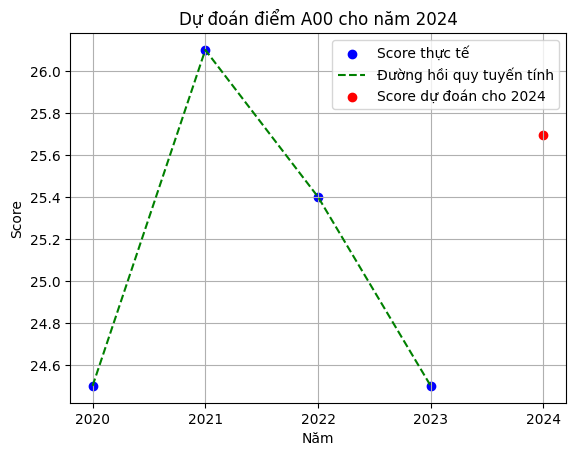

In [127]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Tạo dữ liệu mẫu tương tự như trong mô hình của bạn
data = {
    'year': [2020, 2021, 2022, 2023, 2024],
    'A00_mean': [21.447058, 21.002582, 21.095522, 20.774499, 20.904633],
    'A00_median': [21.90, 21.40, 21.45, 21.15, 21.30],
    'A00_p95': [26.05, 25.45, 25.75, 25.20, 25.75],
    'A00_Total_Student': [291252, 343370, 323673, 325902, 343800],
    'Toán_mean': [6.662271, 6.613891, 6.466254, 6.250557, 6.447309],
    'Toán_median': [7.0, 7.0, 6.8, 6.6, 6.8],
    'Toán_95': [9.0, 8.8, 8.6, 8.4, 8.6],
    'Lí_mean': [6.718001, 6.564922, 6.723779, 6.573900, 6.666866],
    'Lí_median': [7.00, 6.75, 7.00, 6.75, 7.00],
    'Lí_95': [8.75, 8.50, 8.75, 8.75, 8.75],
    'Hóa_mean': [6.705225, 6.629369, 6.703898, 6.744646, 6.680830],
    'Hóa_median': [7.00, 7.00, 7.00, 7.00, 6.75],
    'Hóa_95': [9.00, 8.75, 8.75, 8.75, 9.00],
    'Target': [85, 105, 126, 84, 105],
    'Score': [24.5, 26.1, 25.4, 24.5, None]
}

# Tạo DataFrame
df = pd.DataFrame(data)

# Chia dữ liệu thành biến độc lập (X) và biến phụ thuộc (y)
X = df[df['year'] < 2024][['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student',
                           'Toán_mean', 'Toán_median', 'Toán_95', 'Lí_mean',
                           'Lí_median', 'Lí_95', 'Hóa_mean', 'Hóa_median', 'Hóa_95', 'Target']]
y = df[df['year'] < 2024]['Score']

# Thêm hằng số vào mô hình
X = sm.add_constant(X)

# Huấn luyện mô hình hồi quy tuyến tính
model = sm.OLS(y, X).fit()

# Dự đoán giá trị Score cho các năm trước
y_pred = model.predict(X)

# Dự đoán giá trị Score cho năm 2024
X_2024 = df[df['year'] == 2024][['A00_mean', 'A00_median', 'A00_p95', 'A00_Total_Student',
                                 'Toán_mean', 'Toán_median', 'Toán_95', 'Lí_mean',
                                 'Lí_median', 'Lí_95', 'Hóa_mean', 'Hóa_median', 'Hóa_95', 'Target']]
X_2024 = sm.add_constant(X_2024)
predicted_score_2024 = model.predict(X_2024)



# In kết quả dự đoán cho năm 2024
print(f"Dự đoán Score cho năm 2024: {predicted_score_2024.iloc[0]:.2f}")

# Vẽ các điểm dữ liệu thực tế
plt.scatter(df['year'][:-1], y, color='blue', label='Score thực tế', marker='o')

# Vẽ đường hồi quy tuyến tính từ mô hình
plt.plot(df['year'][:-1], y_pred, color='green', linestyle='--', label='Đường hồi quy tuyến tính')

# Vẽ điểm dự đoán cho năm 2024
plt.scatter(2024, predicted_score_2024, color='red', label='Score dự đoán cho 2024')

# Thiết lập các nhãn trục x
plt.xticks(ticks=[2020, 2021, 2022, 2023, 2024], labels=[2020, 2021, 2022, 2023, 2024])

plt.xlabel('Năm')
plt.ylabel('Score')
plt.title('Dự đoán điểm A00 cho năm 2024')
plt.legend()
plt.grid()
plt.show()


ValueError: shapes (1,1) and (2,) not aligned: 1 (dim 1) != 2 (dim 0)

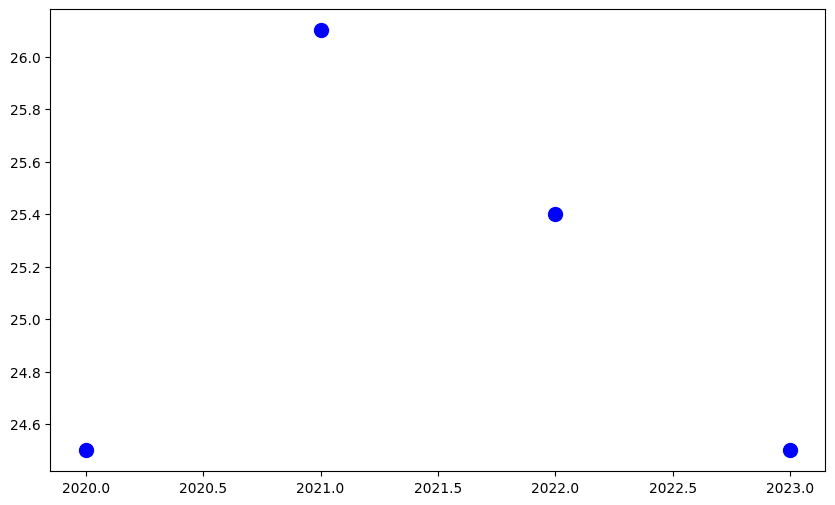

In [128]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np

# Dữ liệu từ các năm trước (ví dụ)
data = {
    'year': [2020, 2021, 2022, 2023],
    'Score': [24.5, 26.1, 25.4, 24.5]
}

a00_df_copy = pd.DataFrame(data)

# Biến độc lập (X) và biến phụ thuộc (y)
X = a00_df_copy[['year']]
y = a00_df_copy['Score']

# Thêm hằng số
X = sm.add_constant(X)

# Huấn luyện mô hình hồi quy tuyến tính
model = sm.OLS(y, X).fit()

# Dự đoán giá trị Score cho các năm đã có dữ liệu
predicted_scores = model.predict(X)

# Tính toán khoảng cách giữa các điểm thực tế và điểm dự đoán
distances = predicted_scores - y.values

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
plt.scatter(a00_df_copy['year'], y, color='blue', label='Score thực tế', s=100)
plt.scatter(2024, model.predict(sm.add_constant(pd.DataFrame({'year': [2024]}))), color='red', label='Score dự đoán cho 2024', s=100)

# Vẽ đường hồi quy tuyến tính
plt.plot(a00_df_copy['year'], predicted_scores, color='green', linestyle='-', label='Đường hồi quy tuyến tính')

# Vẽ các đoạn thẳng từ các điểm thực tế đến đường hồi quy
for i in range(len(y)):
    plt.plot([a00_df_copy['year'][i], a00_df_copy['year'][i]], [y[i], predicted_scores[i]], color='purple', linestyle='--')

plt.title('Dự đoán điểm A00 cho năm 2024')
plt.xlabel('Năm')
plt.ylabel('Score')
plt.xticks(ticks=[2020, 2021, 2022, 2023, 2024], labels=[2020, 2021, 2022, 2023, 2024])
plt.legend()
plt.grid()
plt.show()
